In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import scipy
import scipy.sparse as sps
import matplotlib.pyplot as plt
!pip install python-igraph
import igraph as ig
import time
import pickle

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 9.5 MB/s eta 0:00:00


In [ ]:
import matplotlib
import seaborn as sns

In [ ]:
# Loading LIWC results on the entire posts +  comments dataset
in_dir = "drive/MyDrive/Colab Notebooks/IP-NS/drive_comments/"
in_file = "liwc_results"
df = pd.read_csv(in_dir+in_file+".csv")

<ipython-input-6-47d627d0f14f>:4: DtypeWarning: Columns (3,4) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(in_dir+in_file+".csv")


In [ ]:
# Loading the community assignment and relative documents resulted from applying
#Louvain to the cleaned Pdd of posts
C_l=pickle.load(open(in_dir+"for_future_reference.p",'rb'))
documents=C_l[1]
comm_assignment= C_l[0].toarray()

In [ ]:
# Verifying that comm_assignment is a hard community assignment:
(comm_assignment.sum(axis=1)==np.ones(comm_assignment.shape[0])).sum()==comm_assignment.shape[0]

True

In [ ]:
# Filtering the LIWC dataframe loaded before by including only the posts that
#appear after that ulterior cleaning:
df=df[df['A'].isin(documents)]

In [ ]:
# Verifying that the order the posts appear in the filtered dataframe is the same as in 'documents'
(documents==np.array(df['A'])).sum()==len(df)

True

In [ ]:
# In order to visualize the polarization phenomenon, we choose specific pairs of
# opposite words and define new markers:
df['emotions']=(df['posemo']-df['negemo'])/100
df['female_v_male']=(df['male']-df['female'])/100
df['leisure_v_work']=(df['work']-df['leisure'])/100
df['risk_v_reward']=(-df['risk']+df['reward'])/100
df['us_v_them']=(df['shehe']+df['they']-df['i']-df['affiliation'])/200
df['past_v_present']=(df['focuspresent']-df['focuspast'])/100

In [ ]:
# We also define this new marker 'negativeemotions' to give a sense of how much
#the combination of anger, anxiety and sadness fills the chosen dataset
df['negativeemotions']=(df['anger']+df['anx']+df['sad'])/300

In [ ]:
# Selecting the columns corresponding to the LIWC markers
selCOL=df.columns[6:]

In [ ]:
# Selecting which columns of the dataframe to plot as "polarization plots"
lab_comparisons=['past_v_present','us_v_them','risk_v_reward','leisure_v_work','emotions','female_v_male']
ind_comparisons=[i for i in range(len(selCOL)) if selCOL[i] in lab_comparisons]

In [ ]:
# Selecting which columns of the dataframe to plot as "density plots"
lab_plots=['negativeemotions', 'Analytic', 'Clout', 'Authentic', 'Tone', 'affiliation', 'posemo', 'negemo',
 'anx', 'anger', 'sad', 'swear', 'family', 'friend', 'social', 'focuspresent',
 'focuspast', 'focusfuture', 'risk', 'reward', 'work', 'leisure',
 'death', 'insight']
ind_plots=[i for i in range(len(selCOL)) if selCOL[i] in lab_plots]

In [ ]:
# Localizing which documents belong to which topic and storing this info in a list of lists
topicsindeces=[[i for i in range(comm_assignment.shape[0]) if comm_assignment[i,topic]==1] for topic in
               range(comm_assignment.shape[1])]

In [ ]:
# Defining the following dataframe in order to store the mean values of the markers
#across the various topics
markersdf=pd.DataFrame(np.zeros((comm_assignment.shape[1],len(lab_comparisons)+len(lab_plots))),
                       columns=lab_comparisons+ lab_plots)

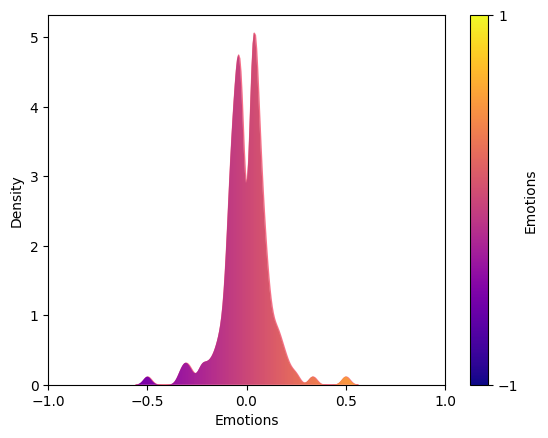

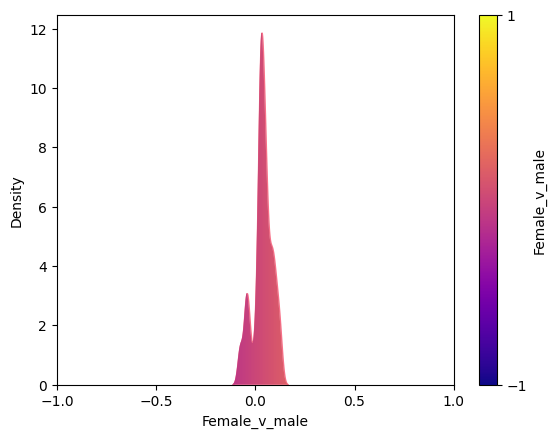

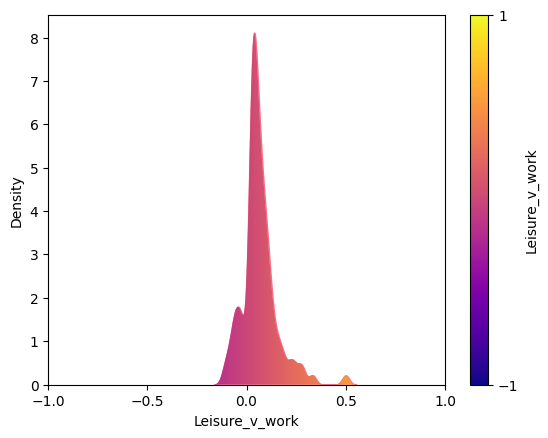

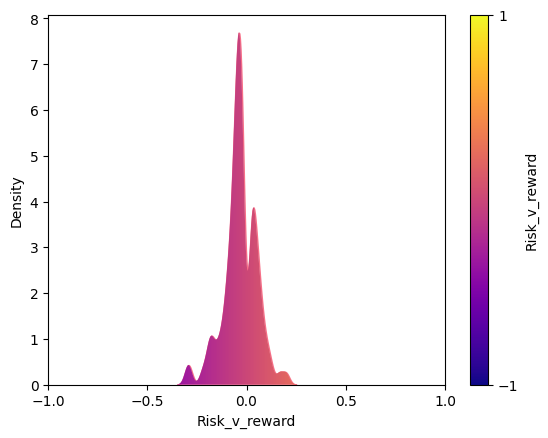

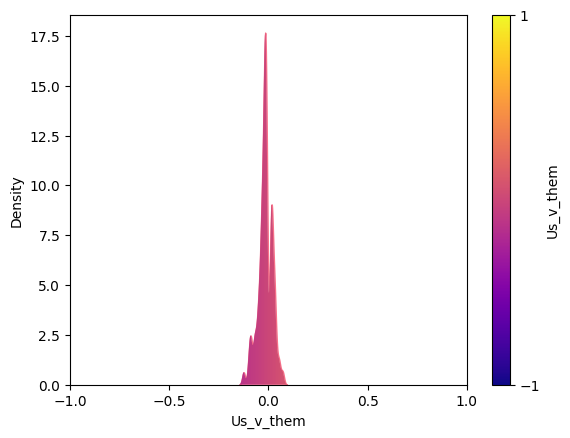

...

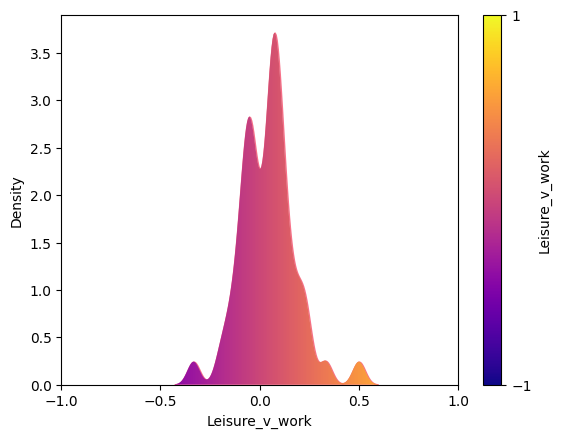

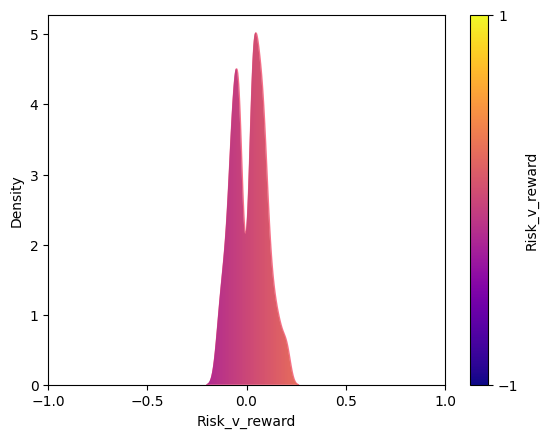

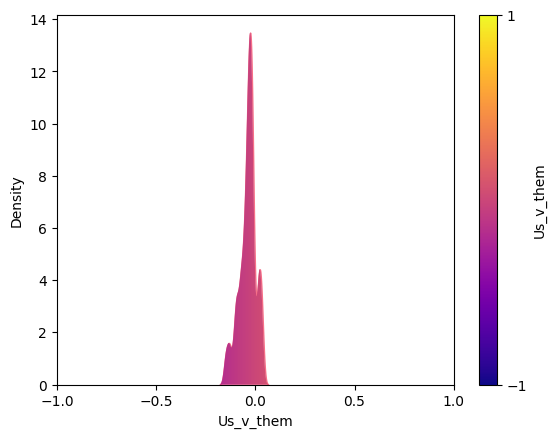

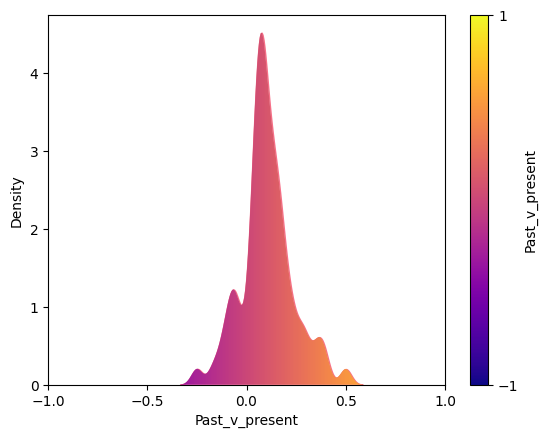

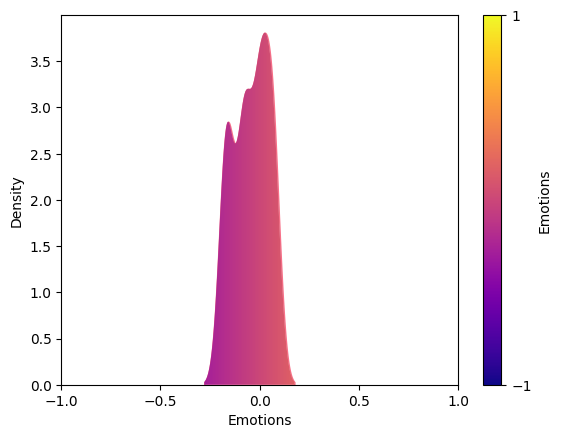

<ipython-input-54-08a0c8e890e5>:22: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_comparisons[j]], fill=True,bw_adjust=0.5)


[249]


<ipython-input-54-08a0c8e890e5>:22: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_comparisons[j]], fill=True,bw_adjust=0.5)


[249]


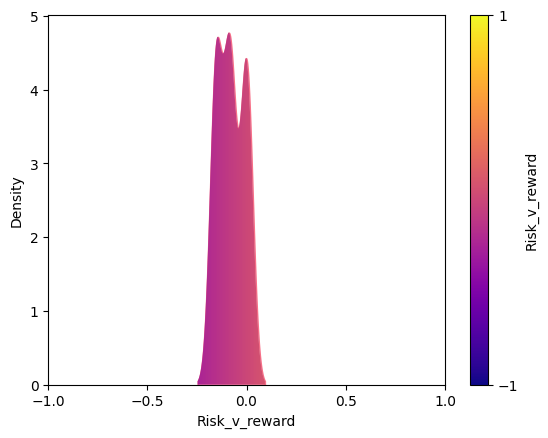

<ipython-input-54-08a0c8e890e5>:22: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_comparisons[j]], fill=True,bw_adjust=0.5)


[249]


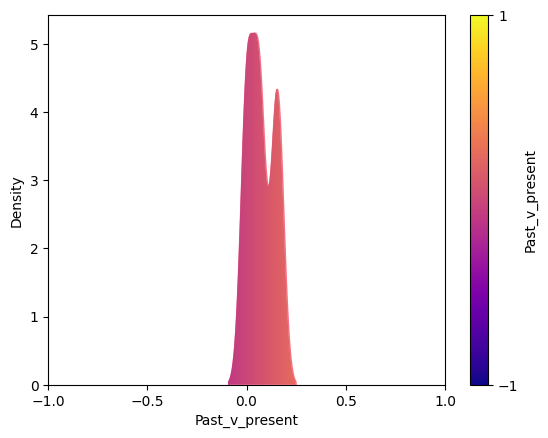

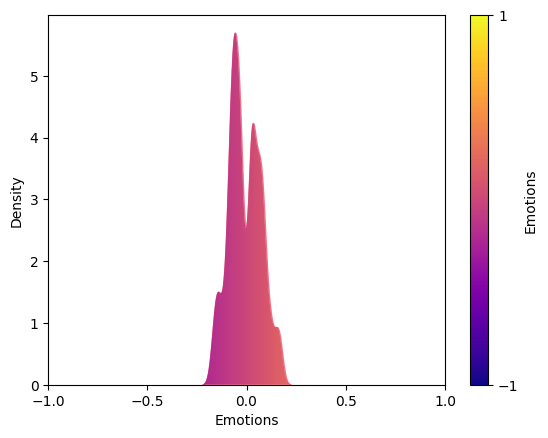

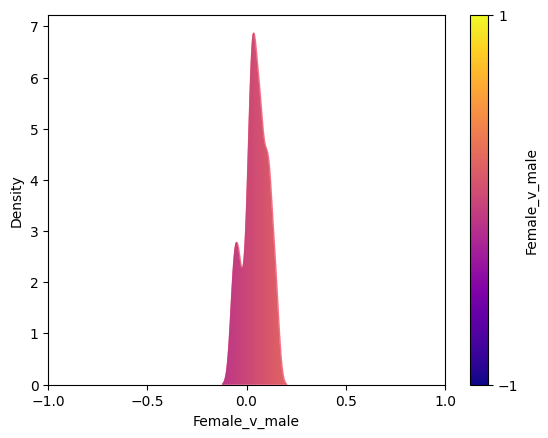

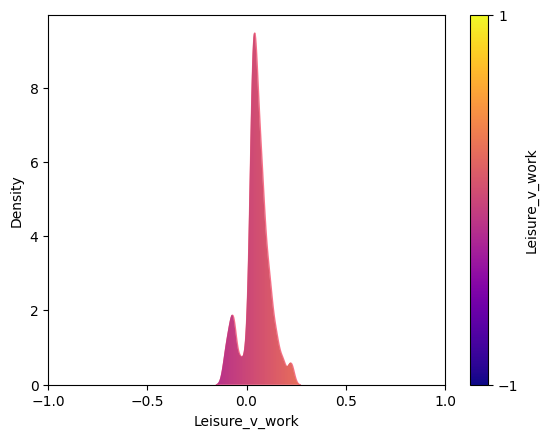

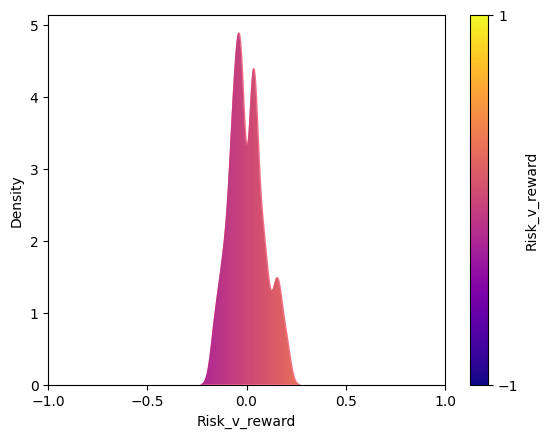

...

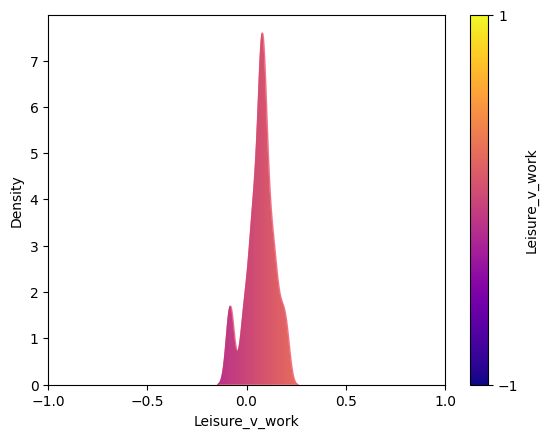

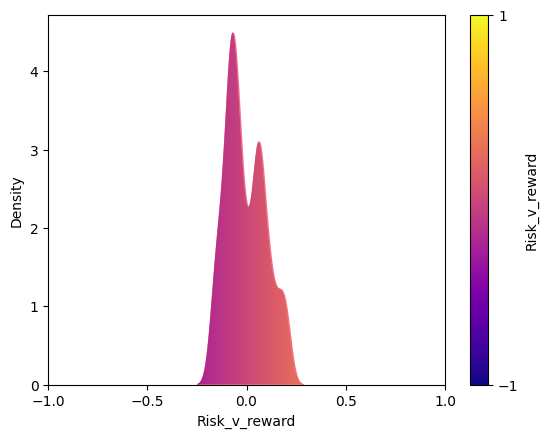

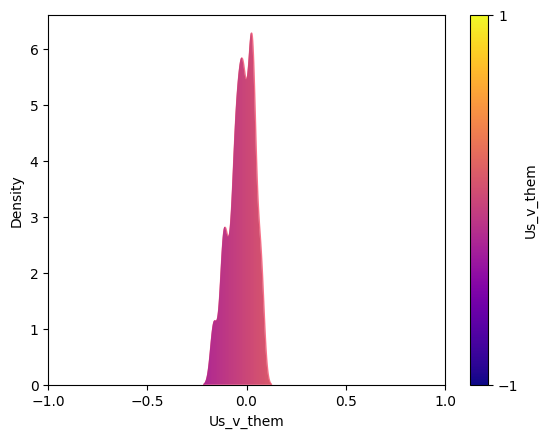

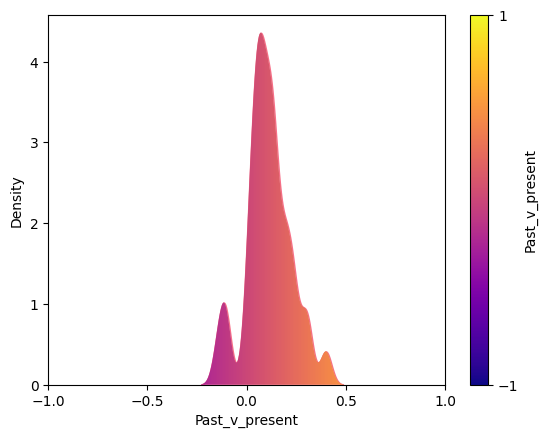

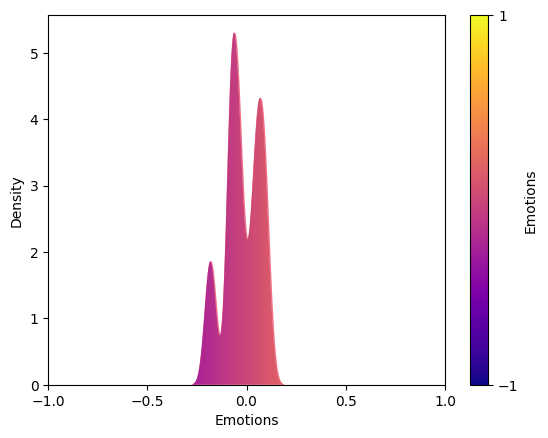

<ipython-input-54-08a0c8e890e5>:22: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_comparisons[j]], fill=True,bw_adjust=0.5)


[57]


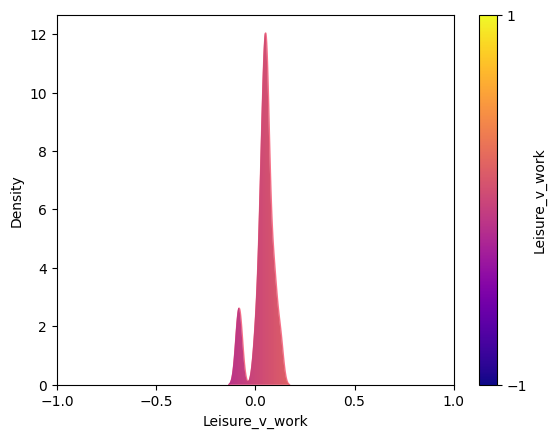

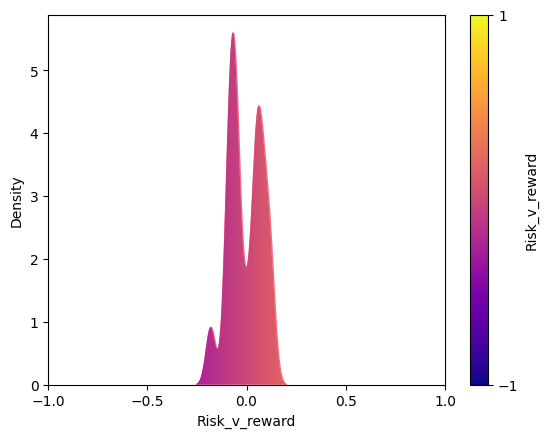

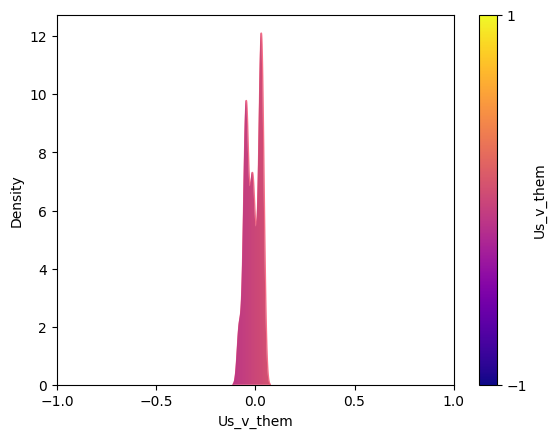

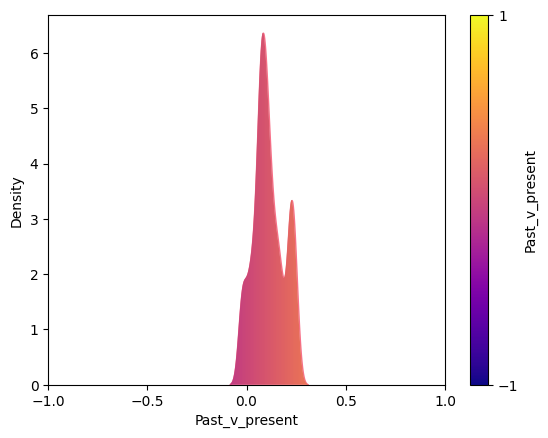

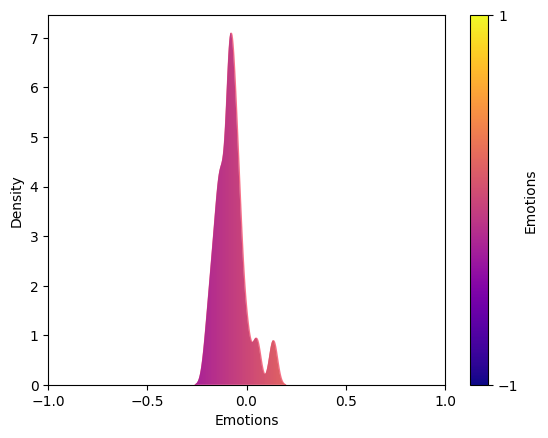

...

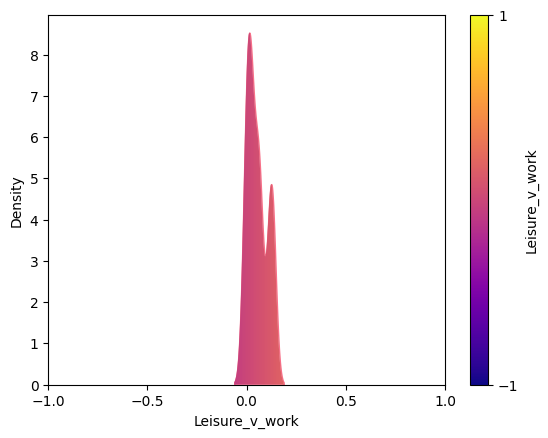

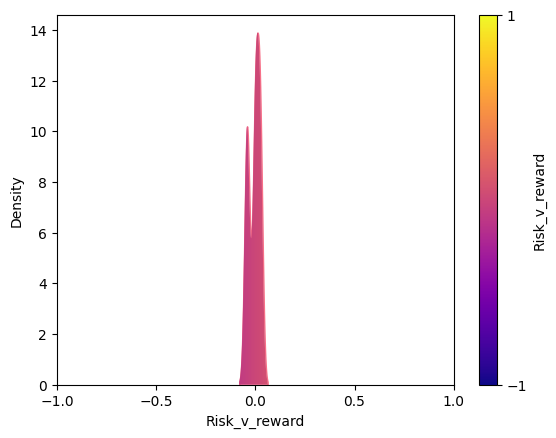

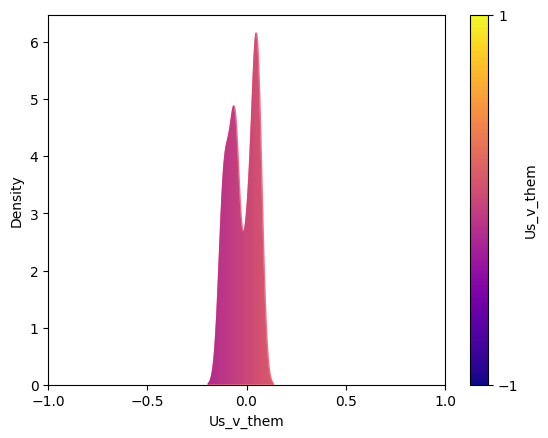

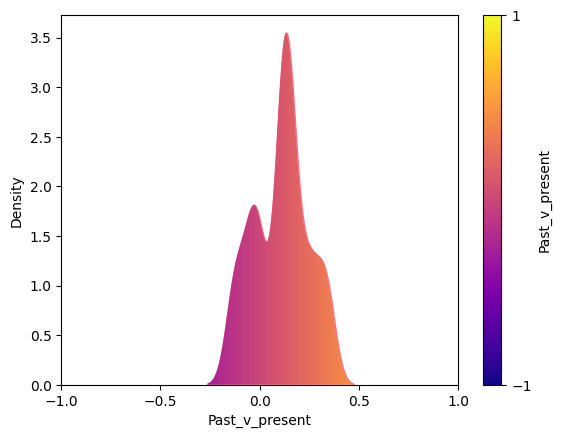

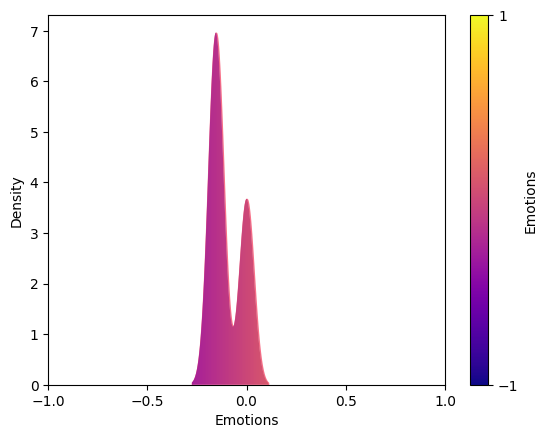

<ipython-input-54-08a0c8e890e5>:22: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_comparisons[j]], fill=True,bw_adjust=0.5)


[8]


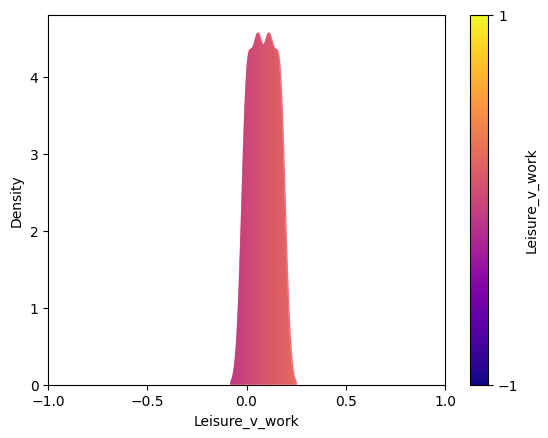

<ipython-input-54-08a0c8e890e5>:22: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_comparisons[j]], fill=True,bw_adjust=0.5)


[8]


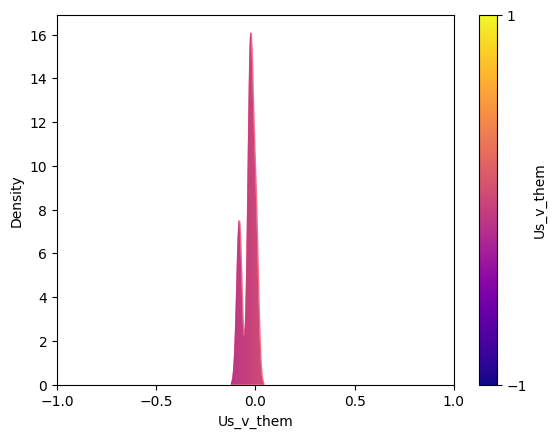

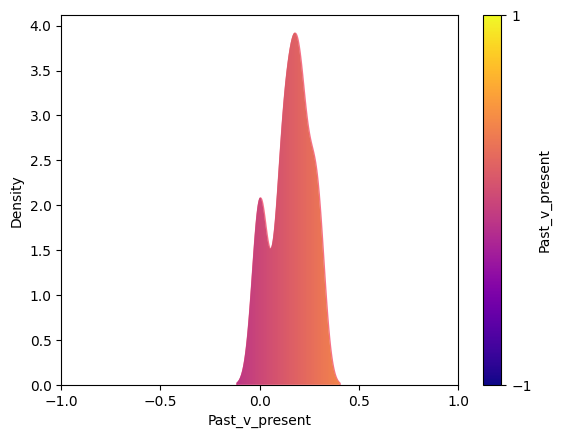

<Figure size 640x480 with 0 Axes>

In [54]:
# Plotting all the chosen markers' "polarization plots":
#first (1) for each single topic detected by louvain, and secondly (2) by rerunning the code
#for the entire dataset and by applying the alterations suggested in the various lines

for i in range(comm_assignment.shape[1]):
  gf=df.iloc[topicsindeces[i],:].copy()

  for j in range(len(ind_comparisons)):

    # For (2) uncomment the next line
    #gf=df.iloc[:,:].copy()
    marker=gf[selCOL[ind_comparisons[j]]].copy()

    # For (2) comment the next line
    markersdf.iloc[i,j]=marker.mean()
    da = np.squeeze(np.asarray(marker))
    k = np.unique(da)
    pk = np.histogram(da,np.append(k,k[-1]+1))[0]

    marker=pd.DataFrame({str(selCOL[ind_comparisons[j]]):k,'y':pk})

    ax = sns.kdeplot(data=marker, x=selCOL[ind_comparisons[j]], fill=True,bw_adjust=0.5)

    cmap = 'plasma'
    im = ax.imshow(np.linspace(-1, 1, 256).reshape(1, -1), cmap=cmap, aspect='auto',
                  extent=[-1,+1, *ax.get_ylim()], zorder=10)
    try:
      path = ax.collections[0].get_paths()[0]
    except:
      print(pk)
    else:
      ax.set_xticks([-1,-0.5,0,0.5,1])
      ax.set_xlabel(selCOL[ind_comparisons[j]].capitalize())
      patch = matplotlib.patches.PathPatch(path, transform=ax.transData)
      im.set_clip_path(patch)
      cbar = plt.colorbar(im, label=selCOL[ind_comparisons[j]].capitalize())

      cbar.set_ticks([-1,1])

      # For (2) replace "'Topics plots/'+f'plot_Topic_{i}_" with "'Entire dataset plots/'+f'plot_"
      plt.savefig(in_dir+'Topics plots/'+f'plot_Topic_{i}_{selCOL[ind_comparisons[j]]}.png')
      plt.show()

    plt.clf()
  # For (2) uncomment the next line
  #break

In [ ]:
# Visualizing the titles of the posts of community 7
df.iloc[[i for i in range(comm_assignment.shape[0]) if comm_assignment[i,7]==1],:].tail(10)['C']

11821    Statistics show that awareness around climate ...
11825    Diseases Are Bred on All Animal Farms, Even th...
11855                 How are you beating climate anxiety?
11886    Malthus was right - we are overpopulated. Unti...
11889                  Psychedelics and collapse awareness
11890    “Ah Shit, Here We Go Again!” - A Casual Critiq...
11898    Neoliberalism: It's Bad History, It's Bad Scie...
11966    Just some thoughts I had this morning on the s...
11979                   The reality of the war in Ukraine.
12267        Ok, can someone tell me how bad my resume is?
Name: C, dtype: object

<ipython-input-39-222c23866072>:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('viridis')


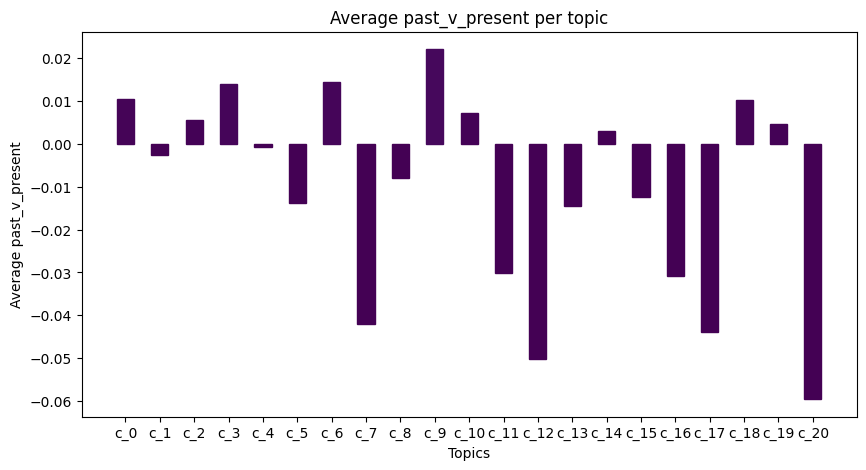

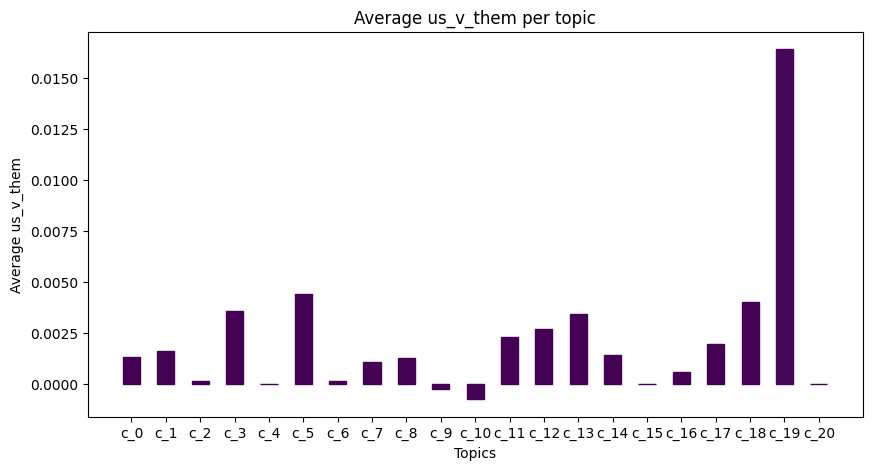

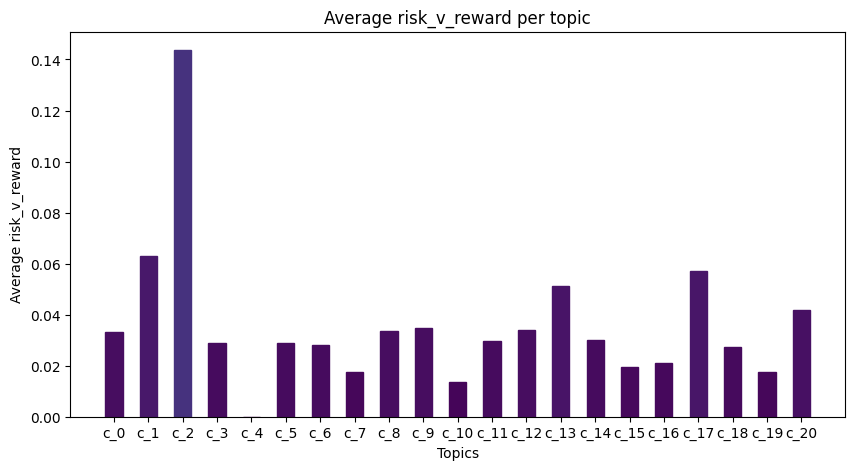

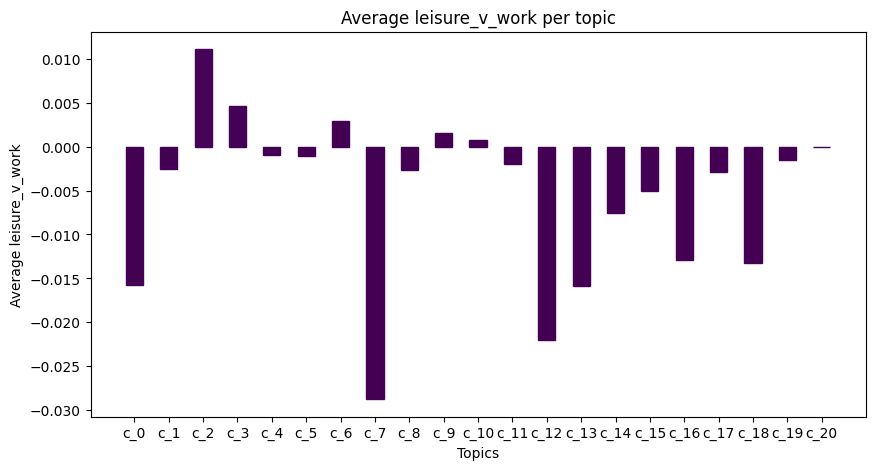

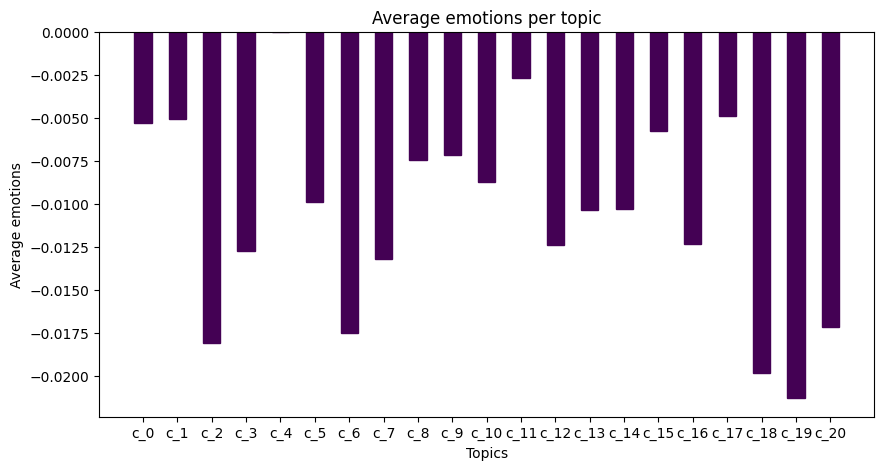

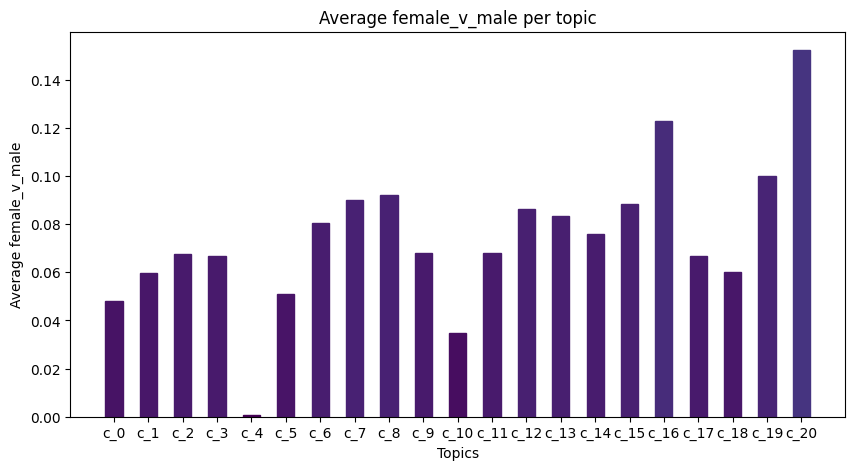

In [ ]:
# Plotting the averages of polarization markers across all 21 communities
cmap = plt.cm.get_cmap('viridis')
names=['c_{}'.format(i) for i in range(comm_assignment.shape[1])]
for i in range(len(lab_comparisons)):
  plt.figure(figsize=(10,5))
  sns.set_palette("husl")
  bars=plt.bar(names,markersdf.iloc[:,i], width=0.5)
  for j in range(len(names)):
    bars[j].set_color(cmap((markersdf.iloc[j,i])))
    # If we want to color the bars in a clearer but less accurate way:
    # + abs(markersdf.iloc[:,i]).max())/ (2*abs(markersdf.iloc[:,i]).max())))

  n = len(markersdf)
  plt.xlabel('Topics')
  plt.ylabel('Average {}'.format(lab_comparisons[i]))
  plt.title('Average {} per topic'.format(lab_comparisons[i]))
  plt.savefig(in_dir+'Average plots/'+f'plot_average_{lab_comparisons[i]}.png')
  plt.show()

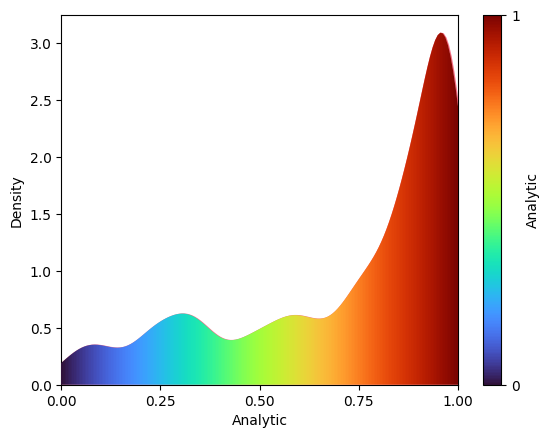

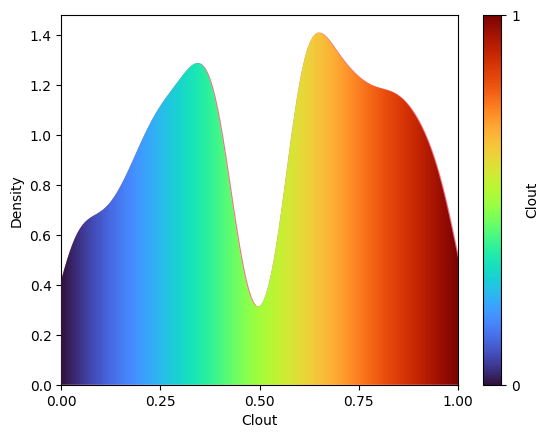

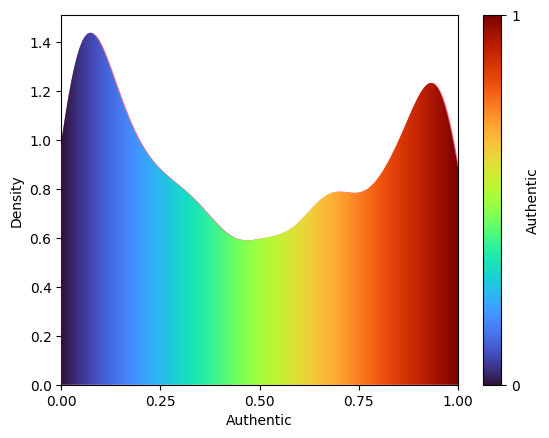

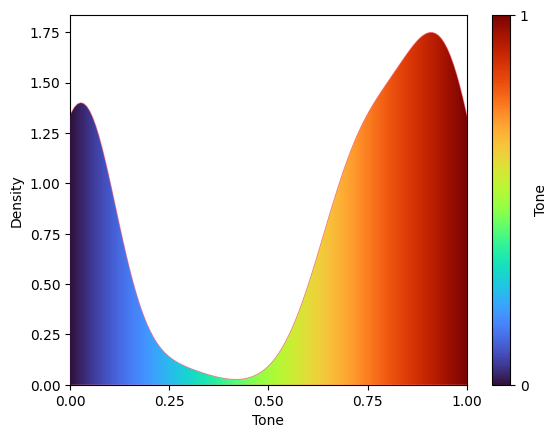

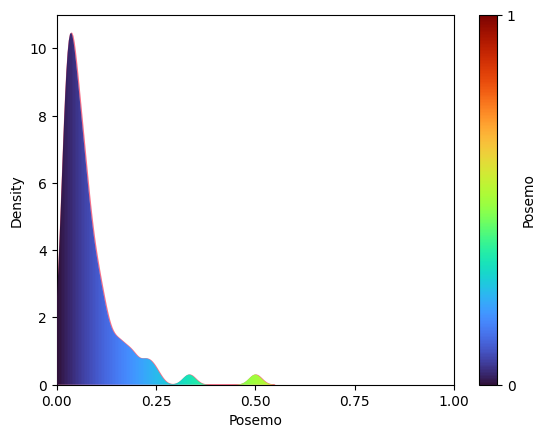

...

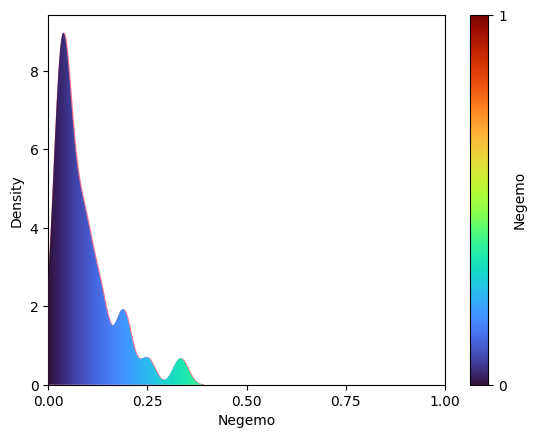

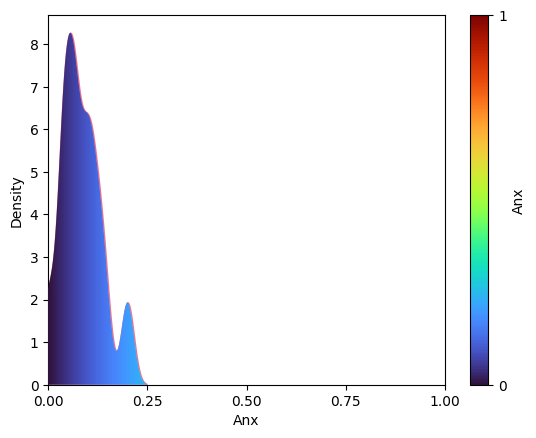

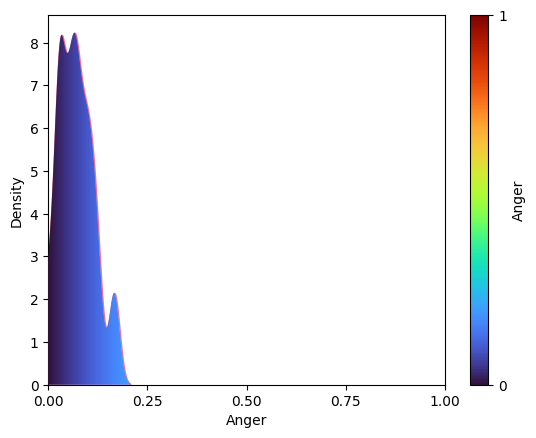

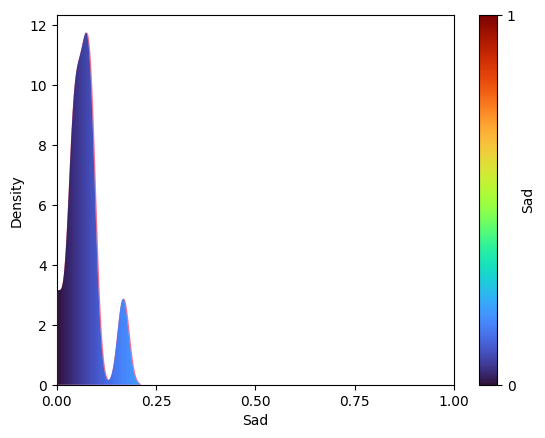

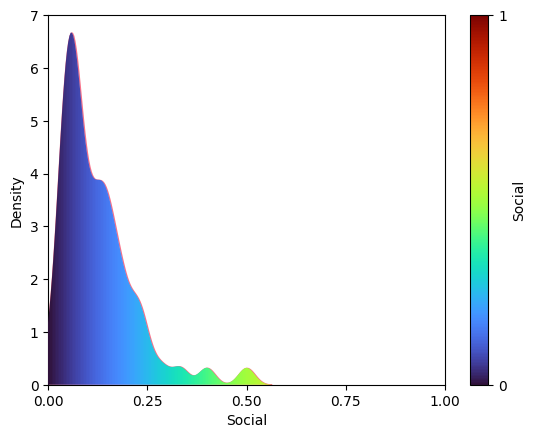

<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)


[391]


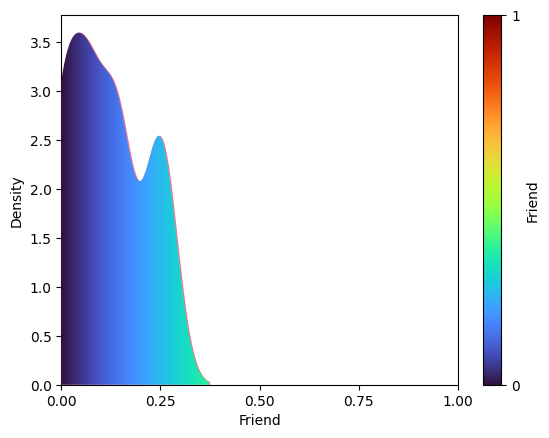

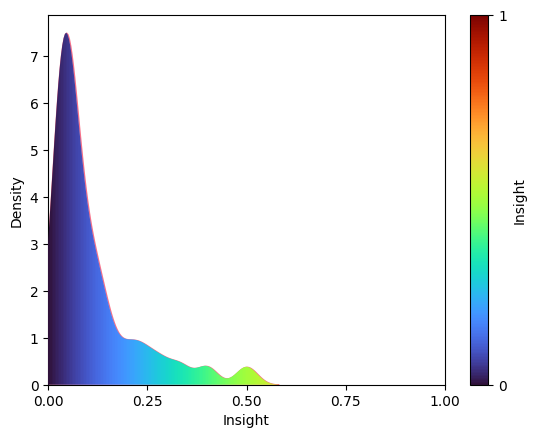

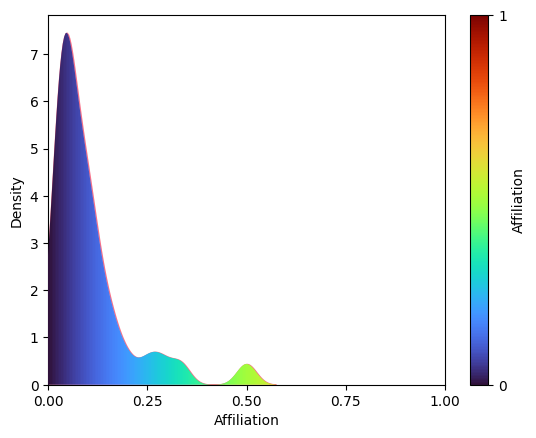

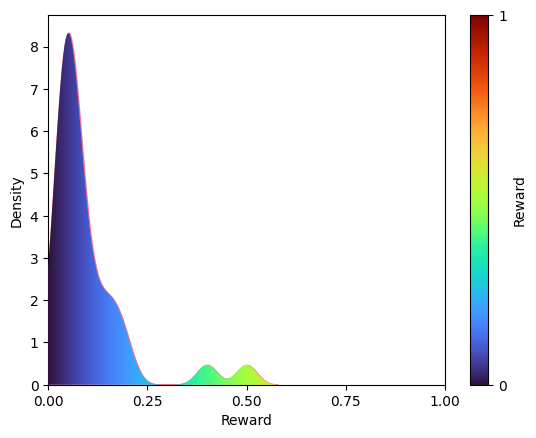

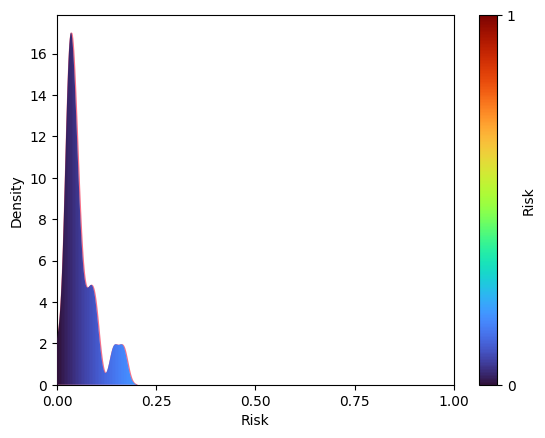

...

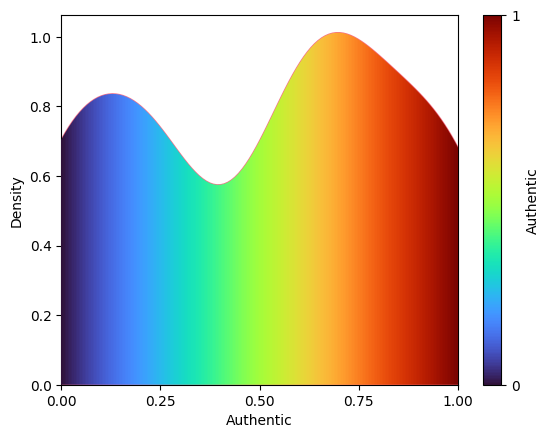

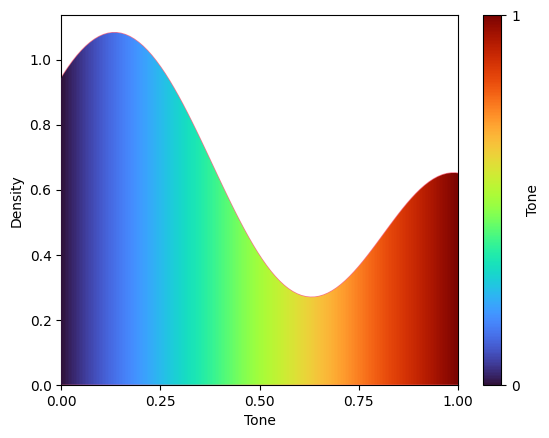

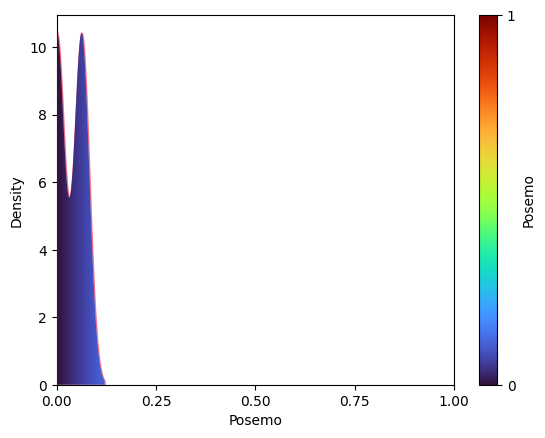

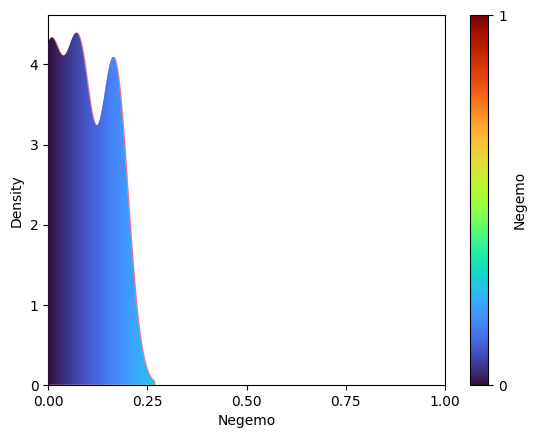

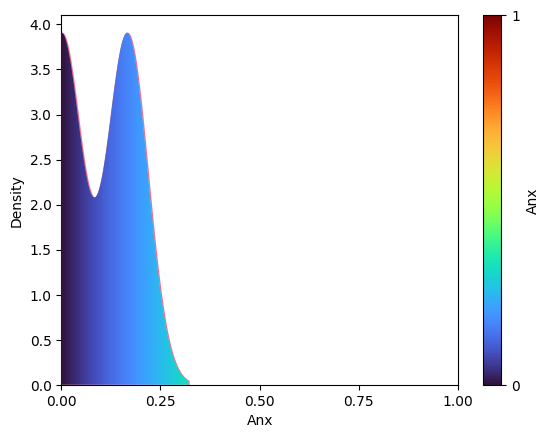

<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)
<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)


[249]
[249]


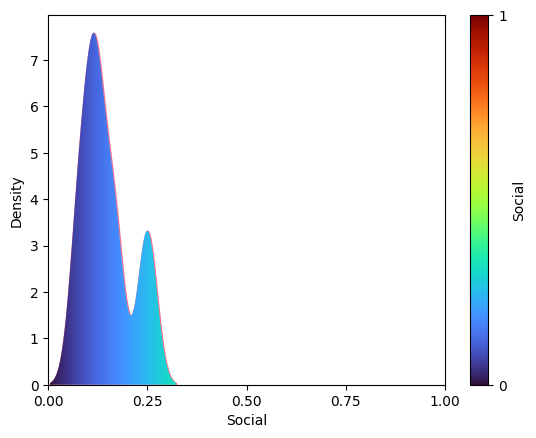

<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)
<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)


[249]
[249]


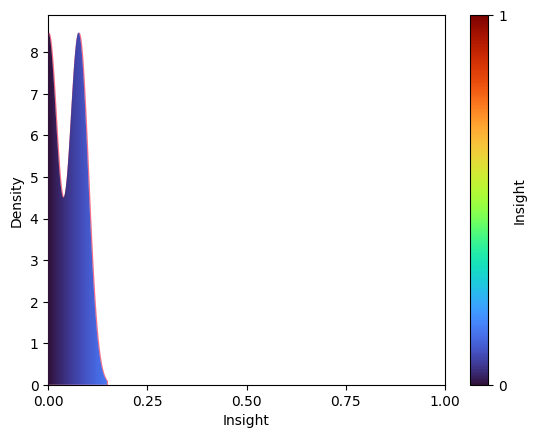

<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)
<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)


[249]
[249]


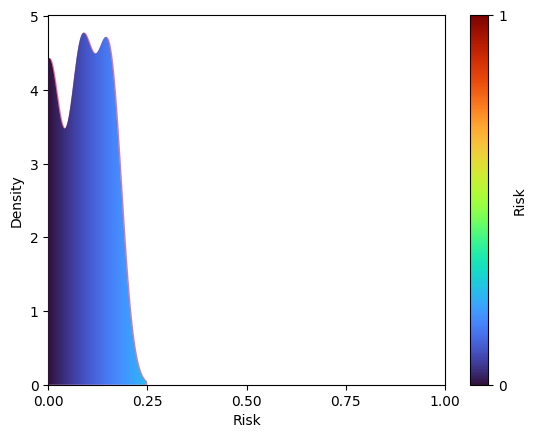

<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)


[249]


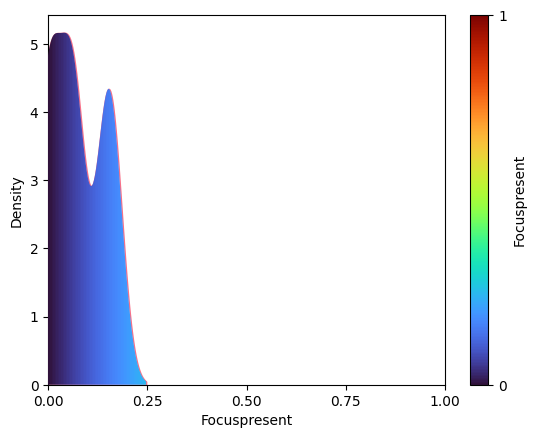

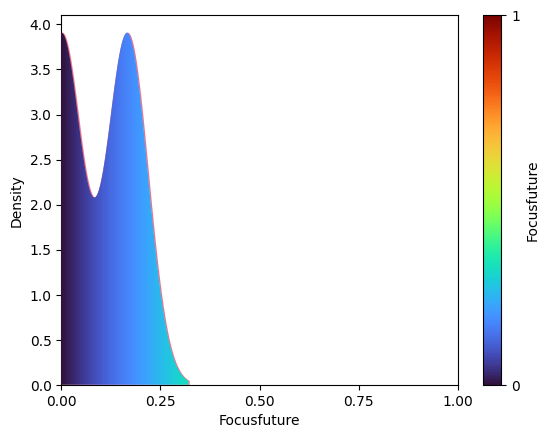

<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)
<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)


[249]
[249]


<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)
<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)


[249]
[249]


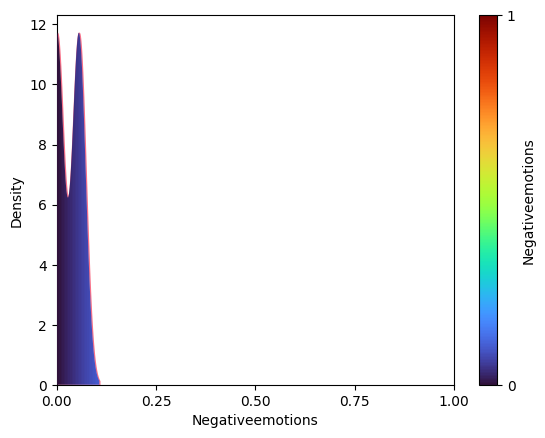

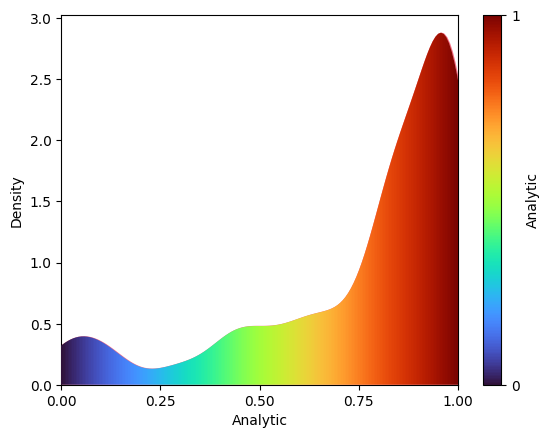

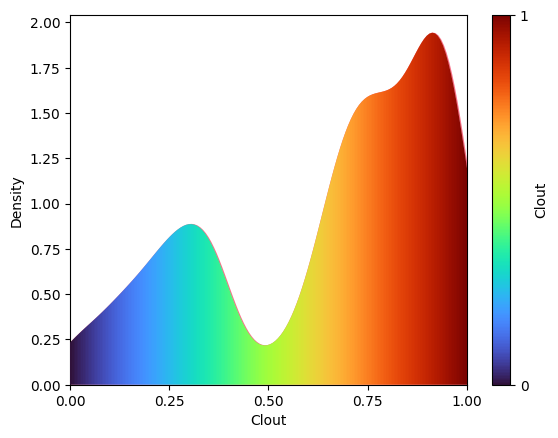

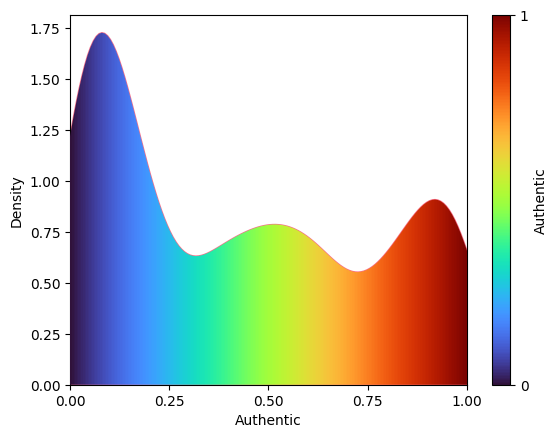

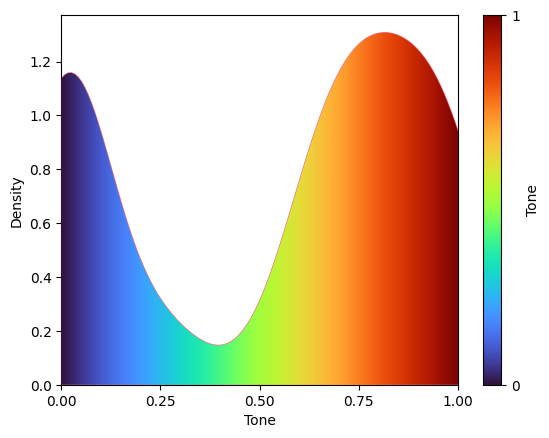

...

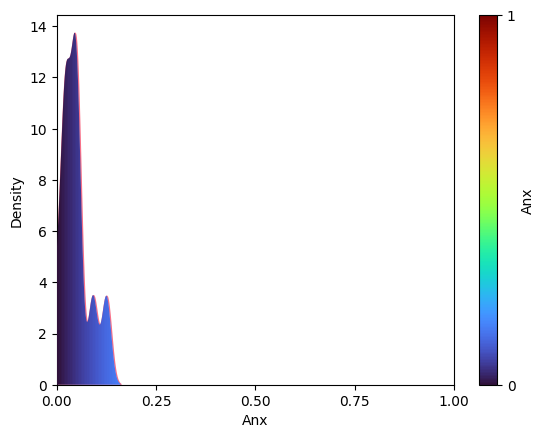

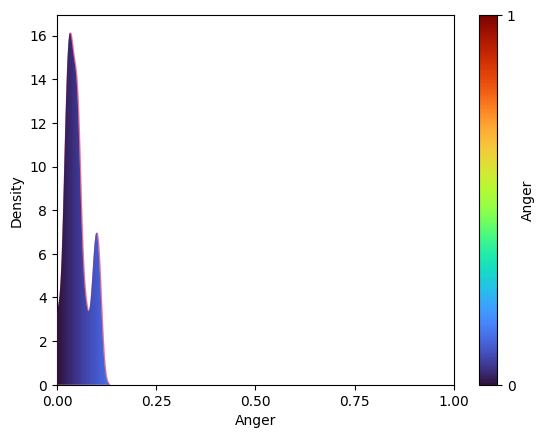

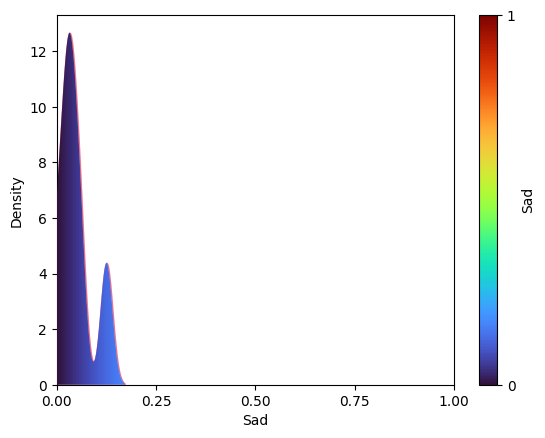

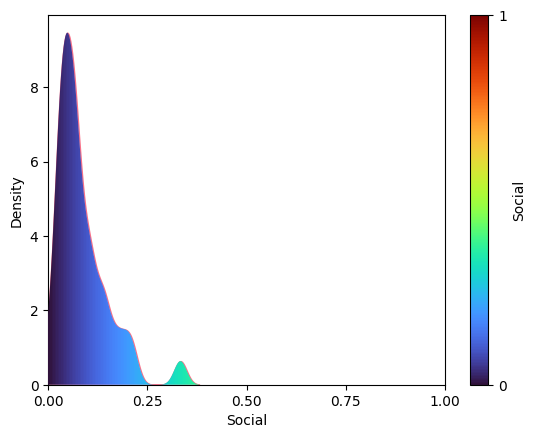

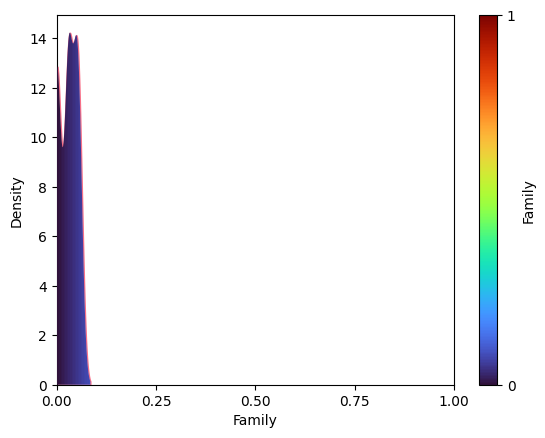

<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)


[121]


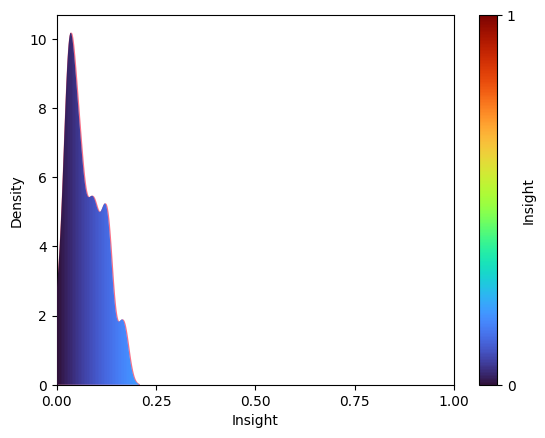

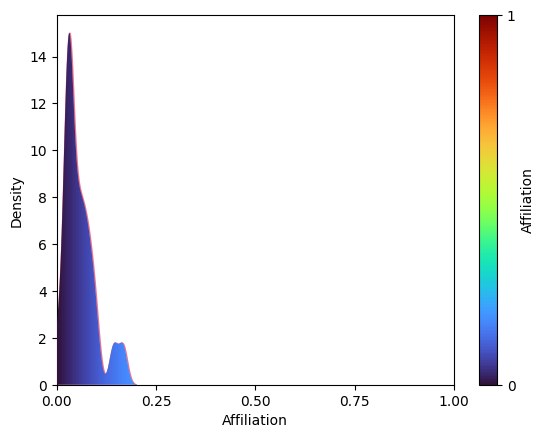

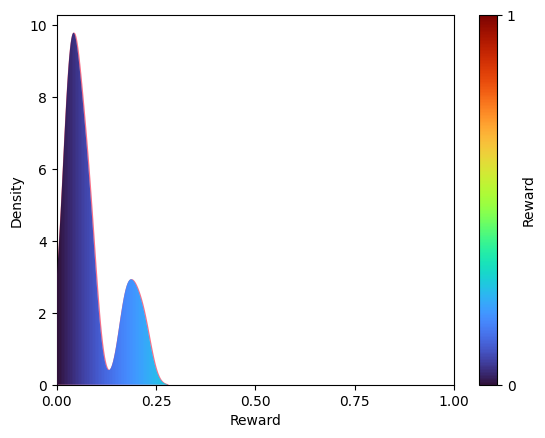

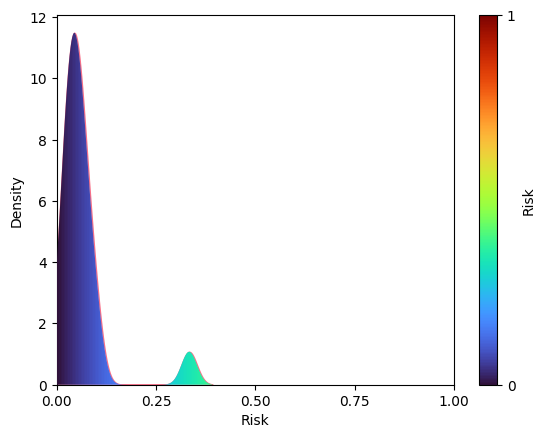

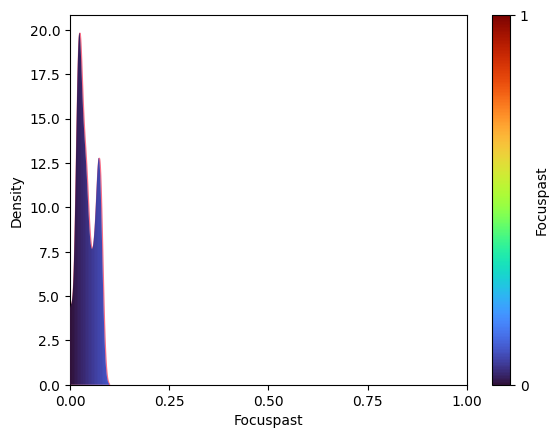

...

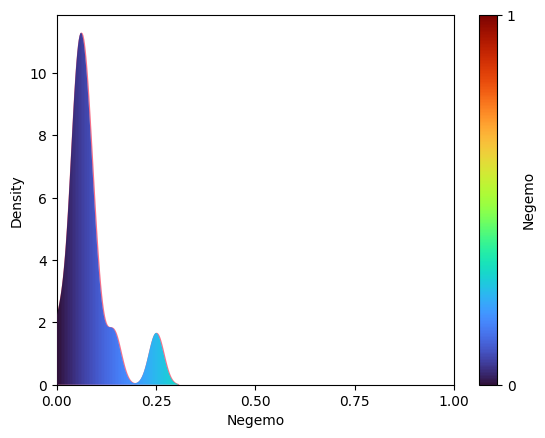

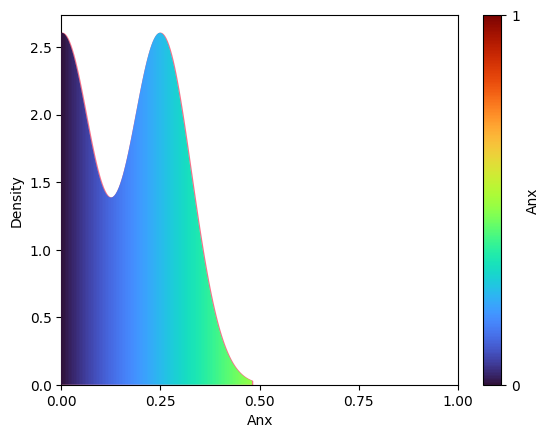

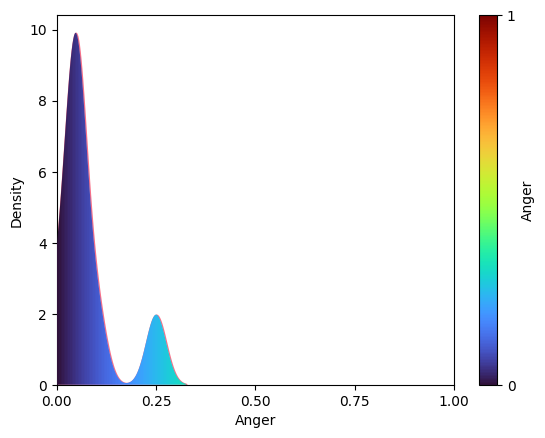

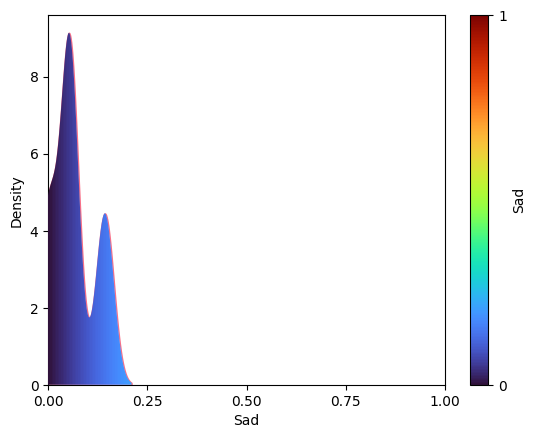

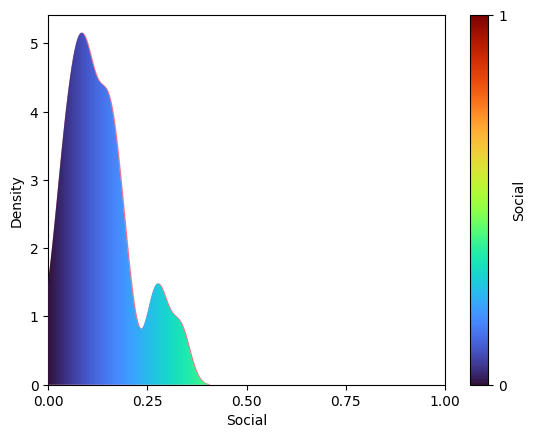

<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)


[121]


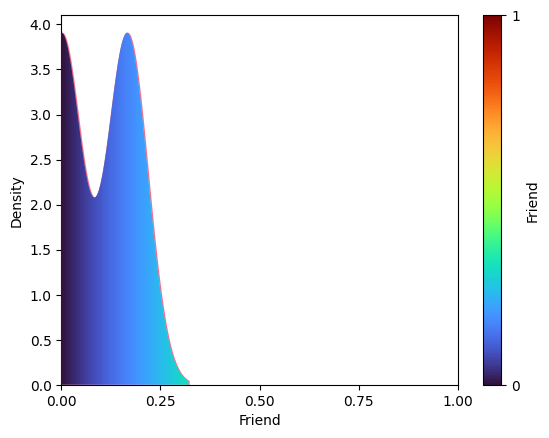

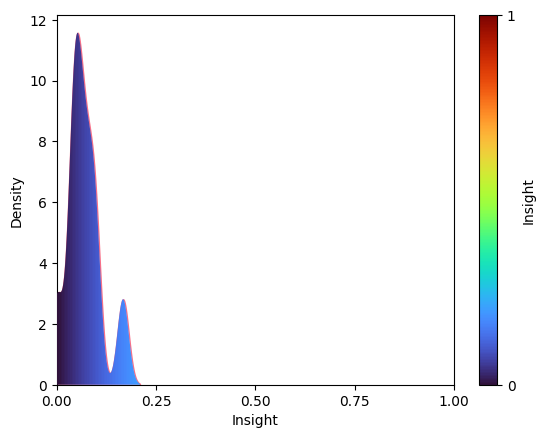

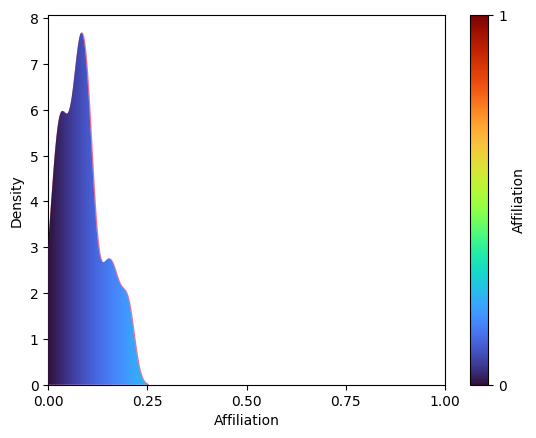

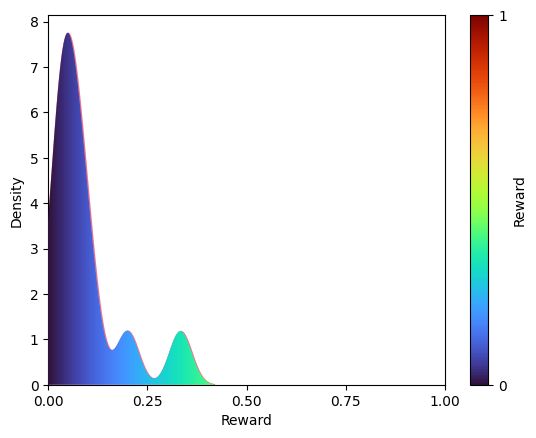

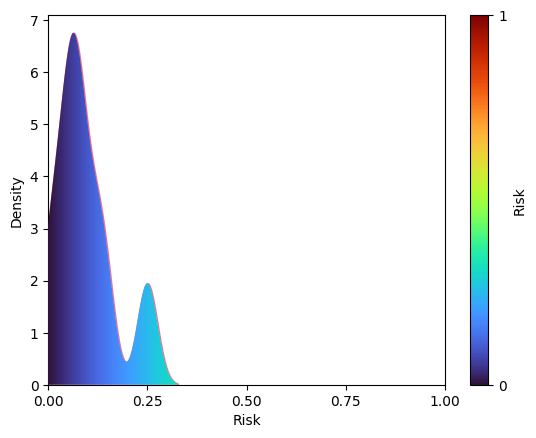

...

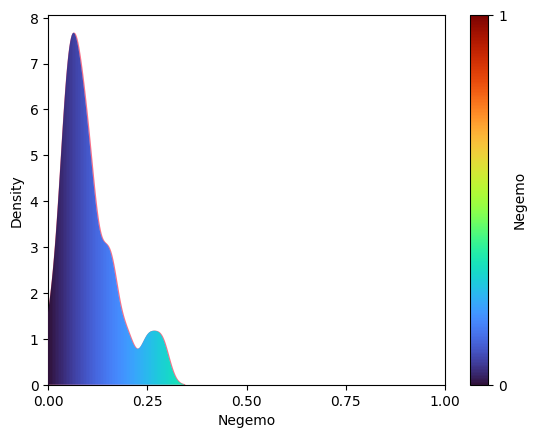

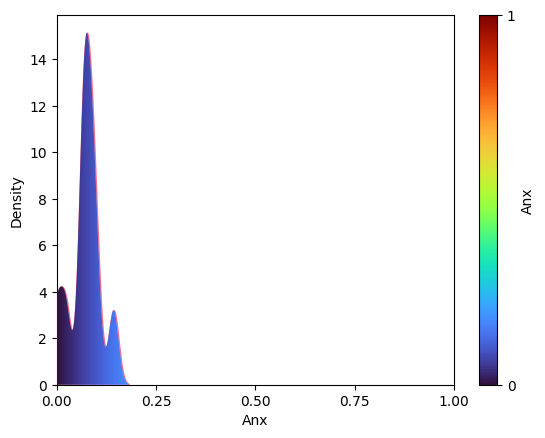

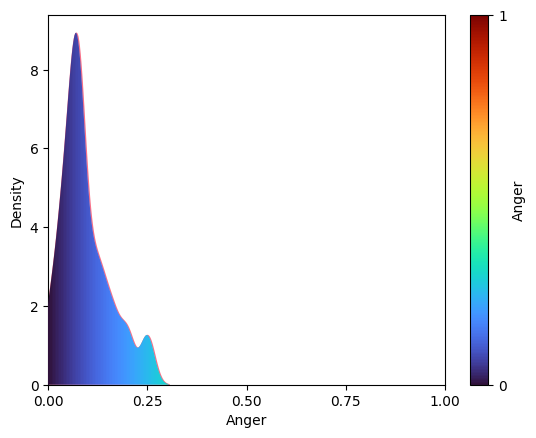

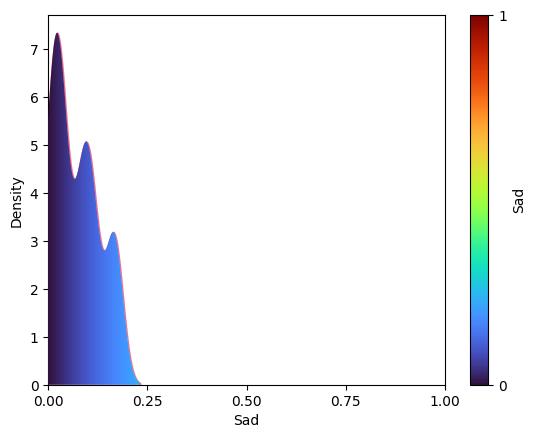

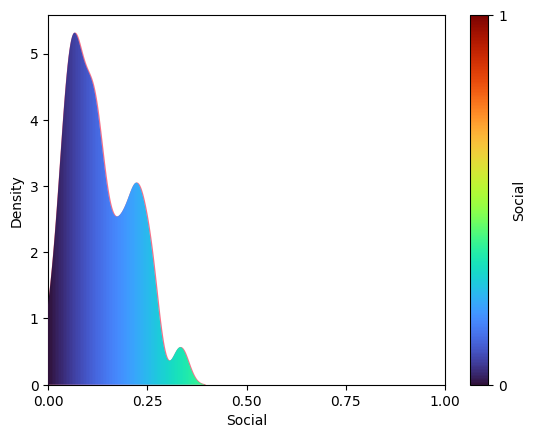

<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)


[119]


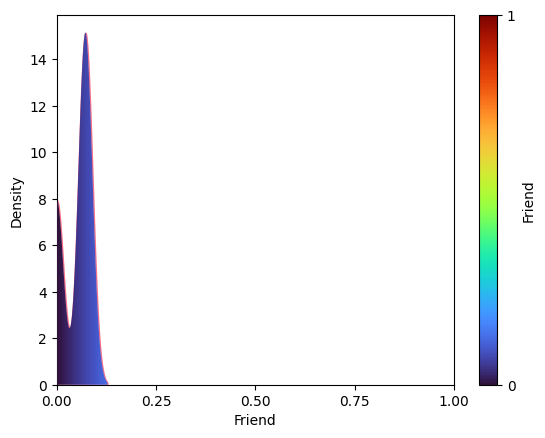

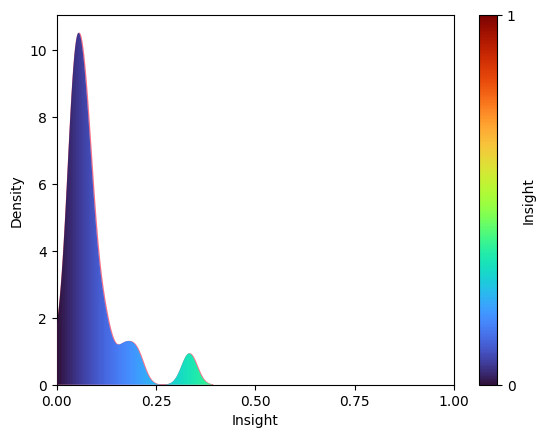

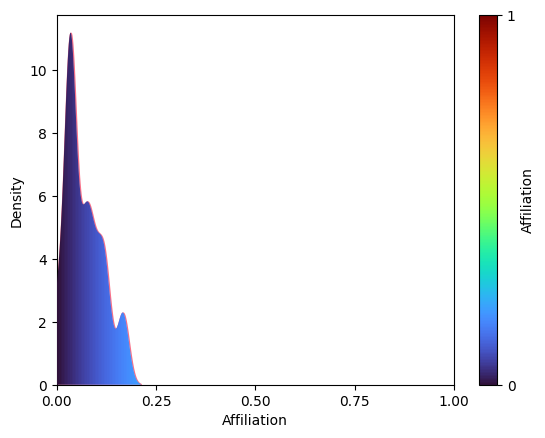

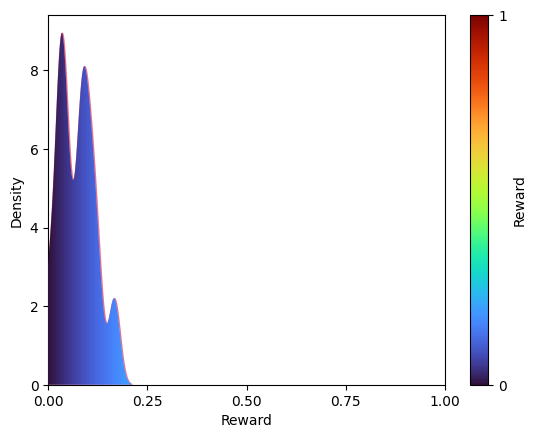

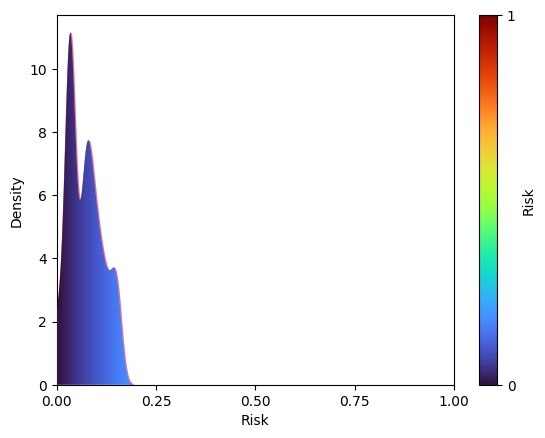

...

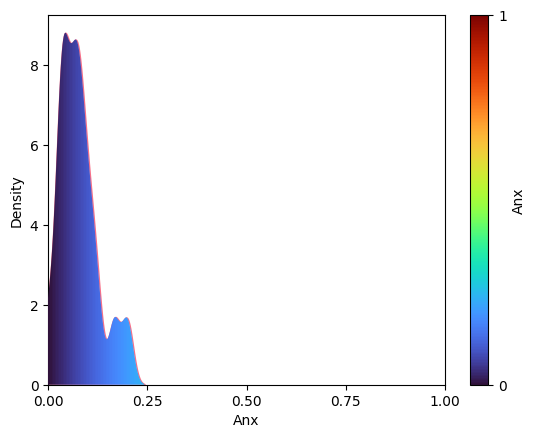

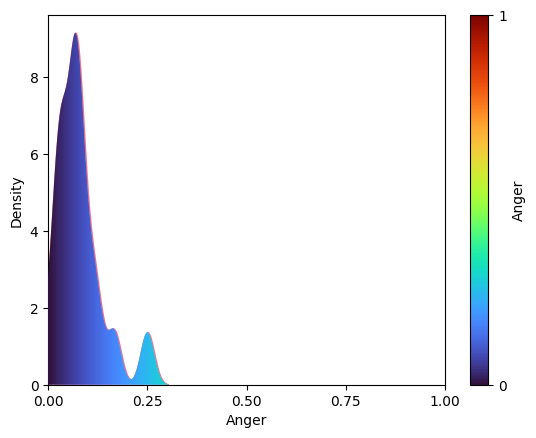

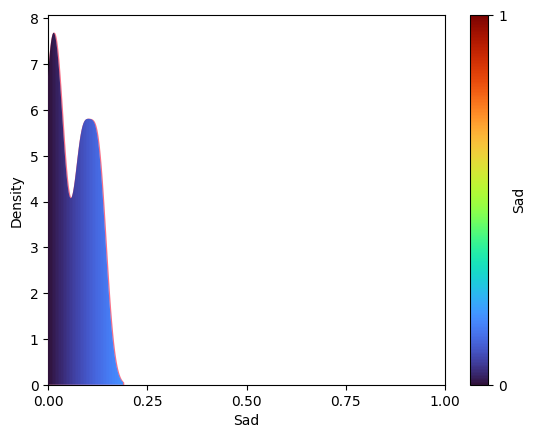

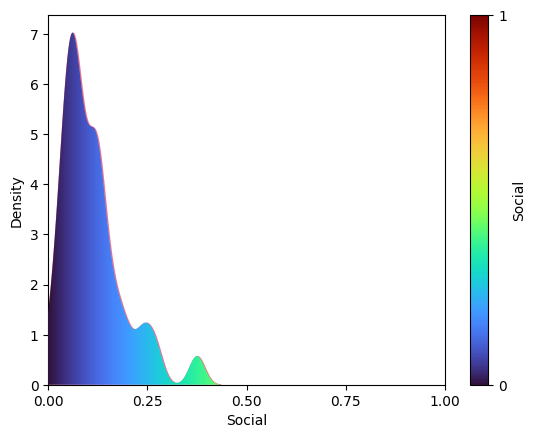

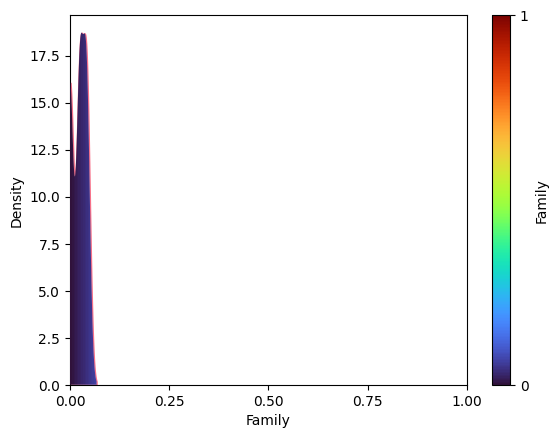

<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)


[104]


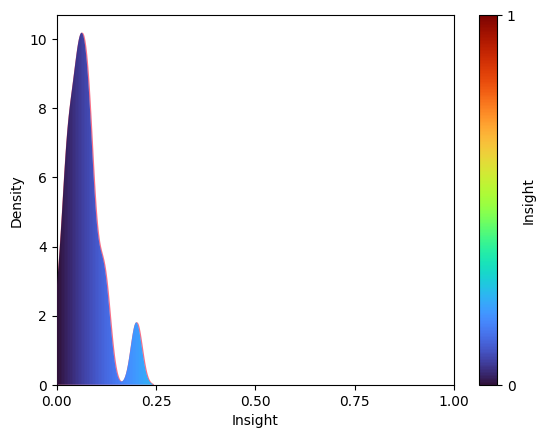

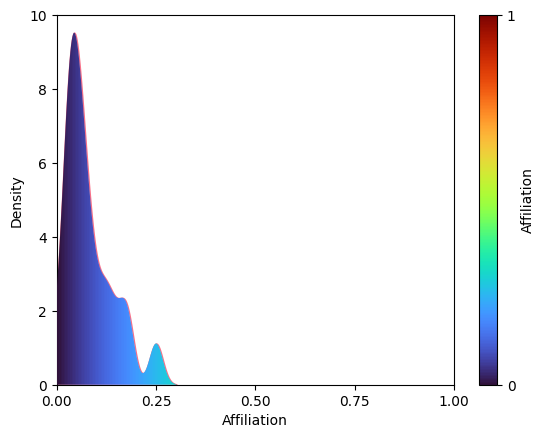

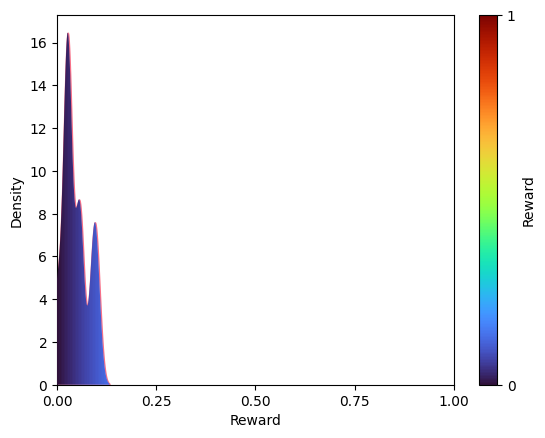

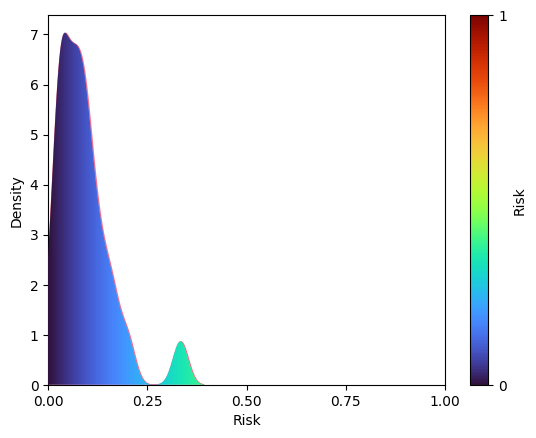

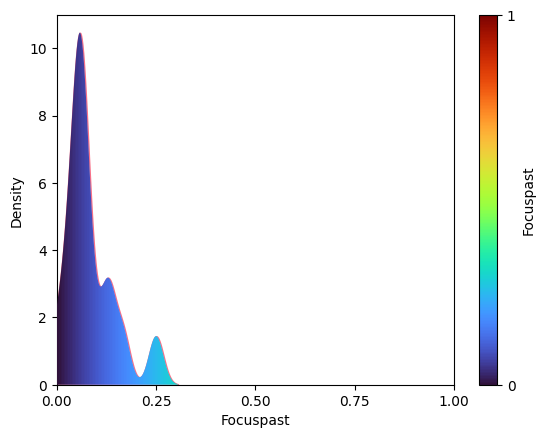

...

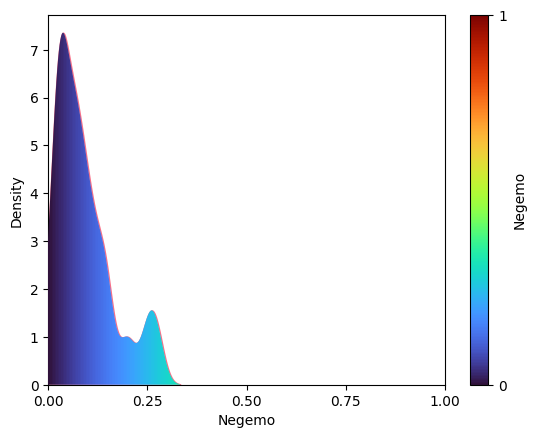

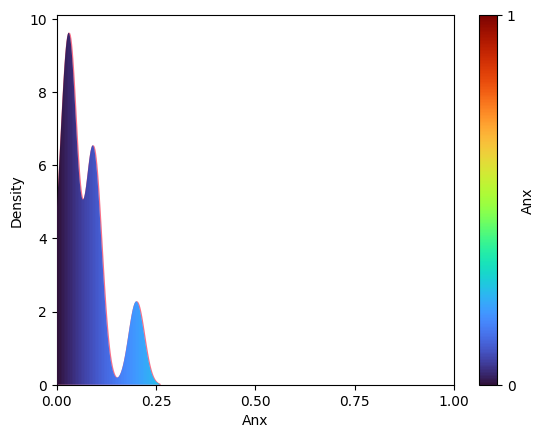

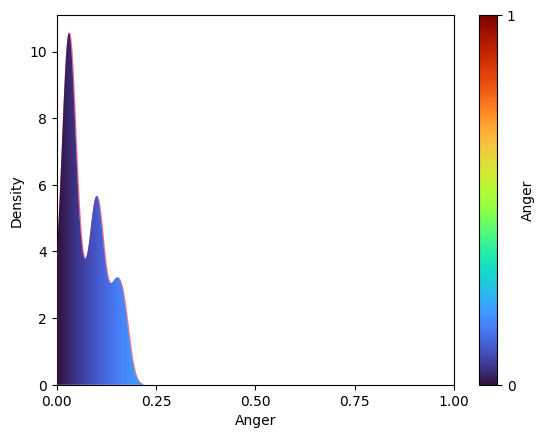

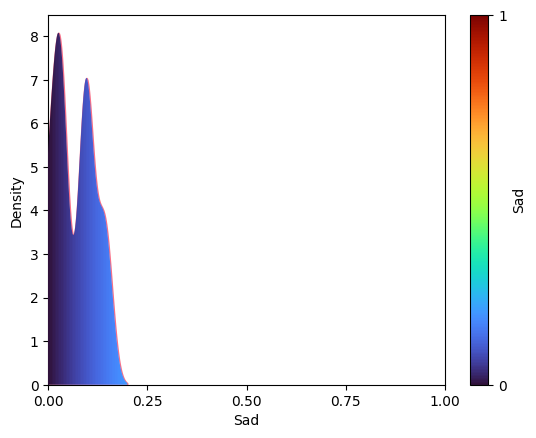

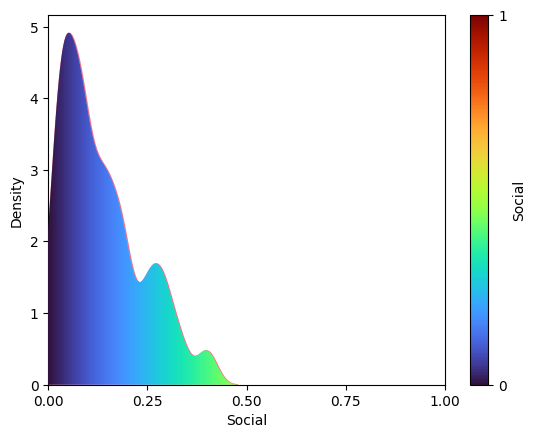

<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)


[83]


<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)


[83]


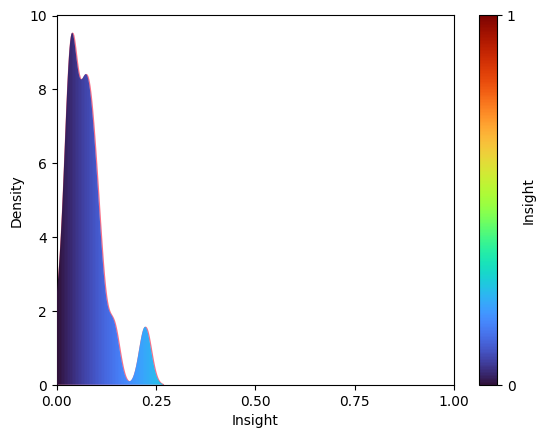

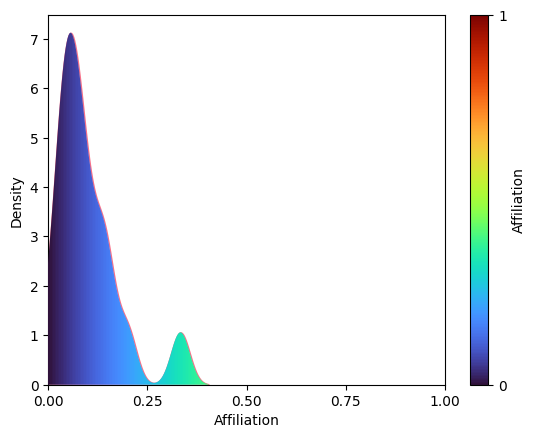

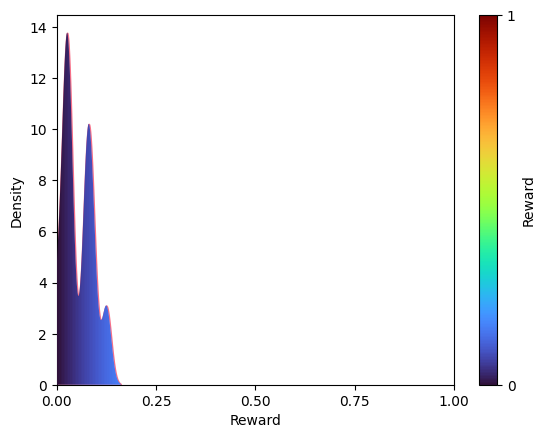

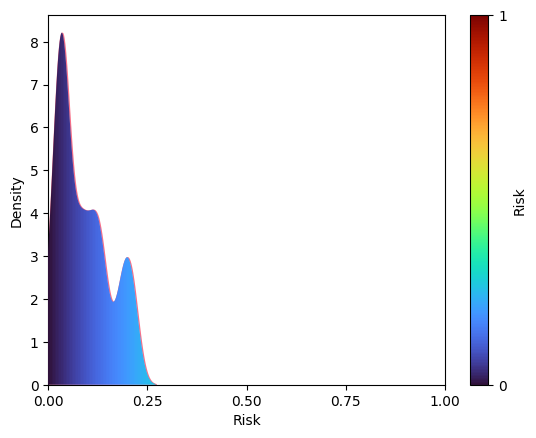

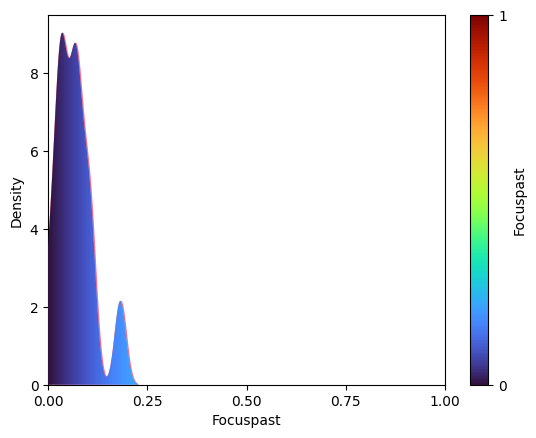

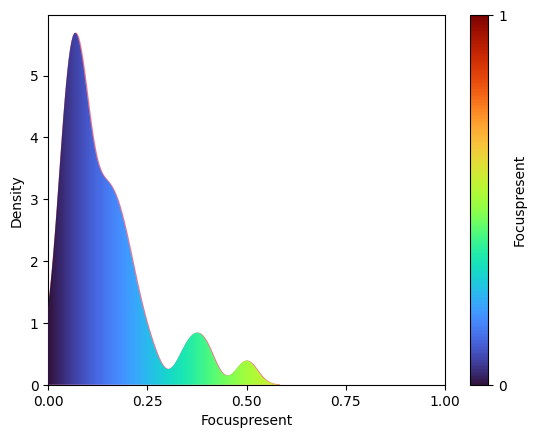

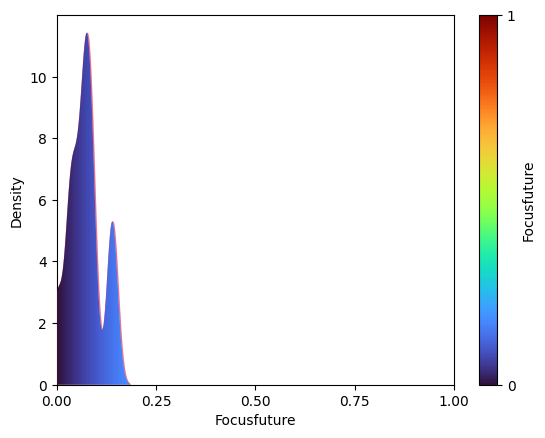

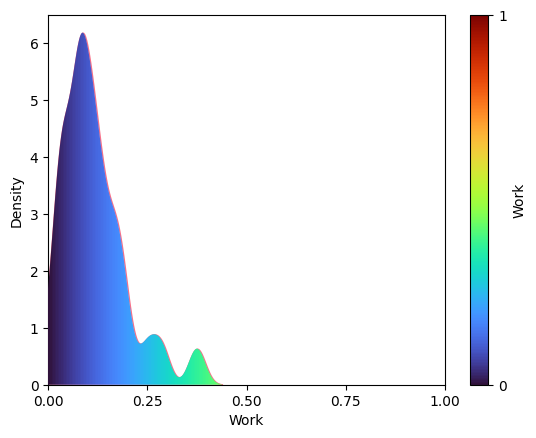

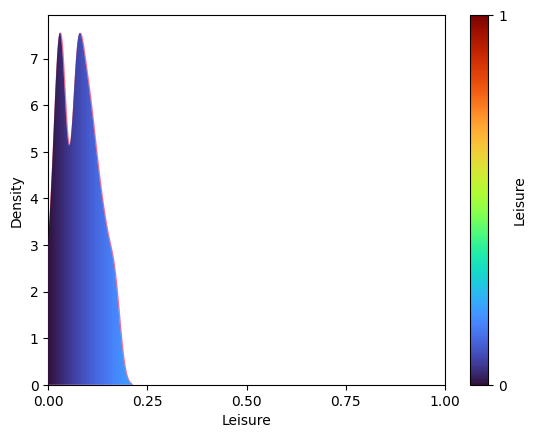

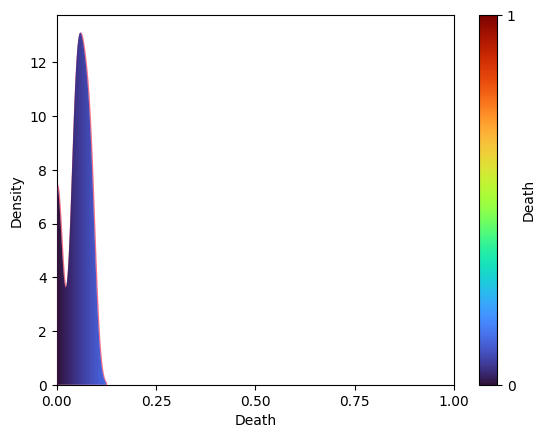

<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)


[83]


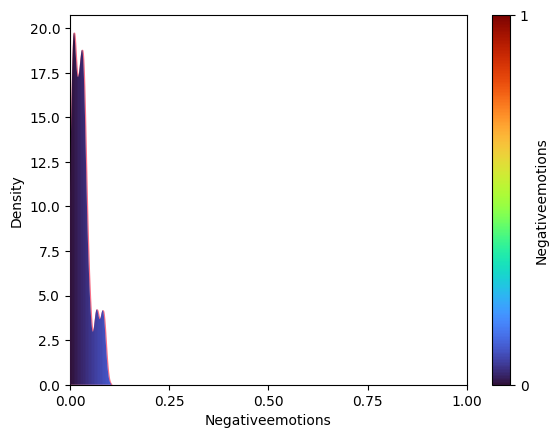

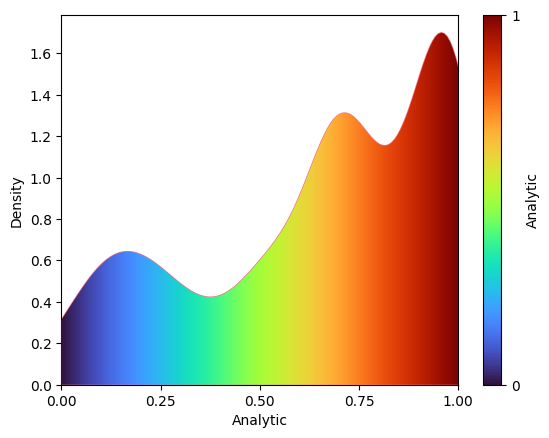

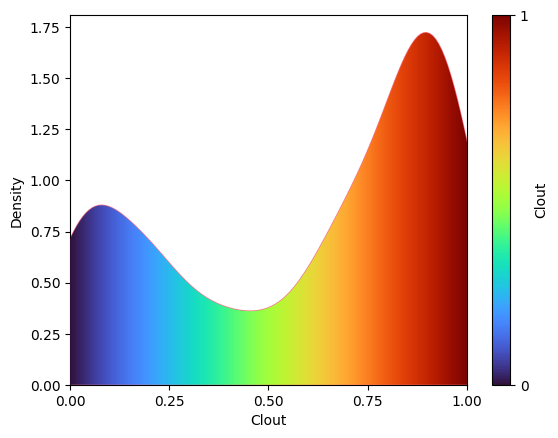

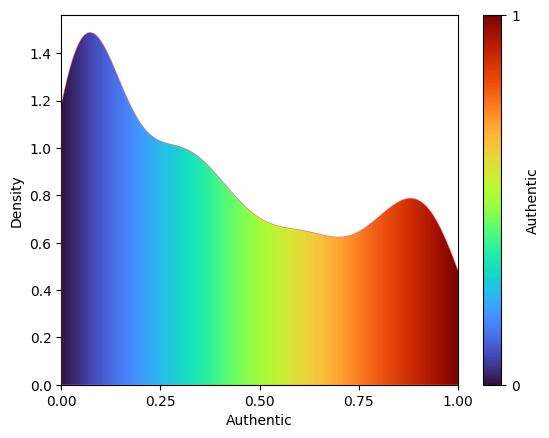

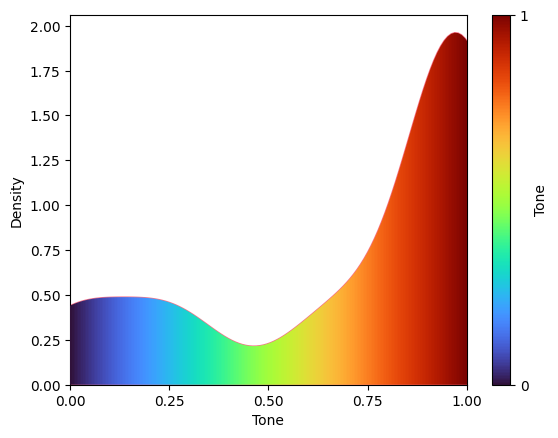

...

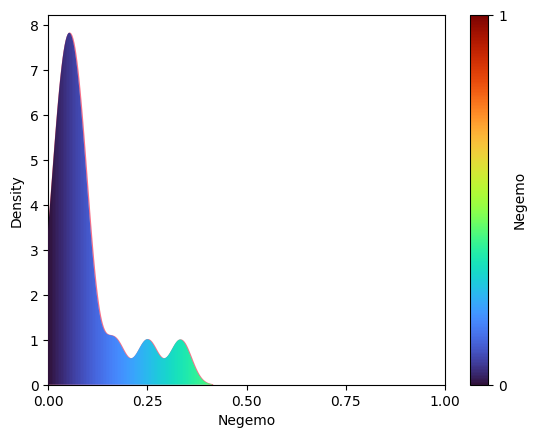

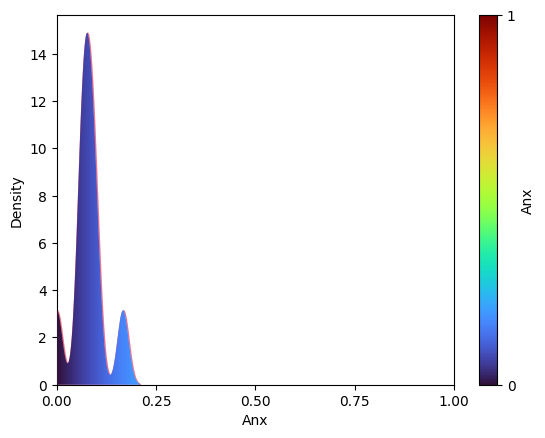

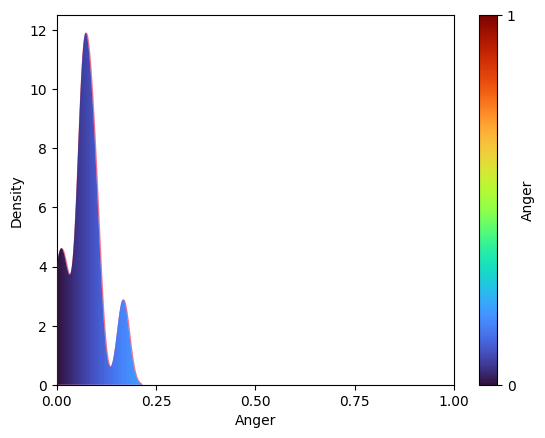

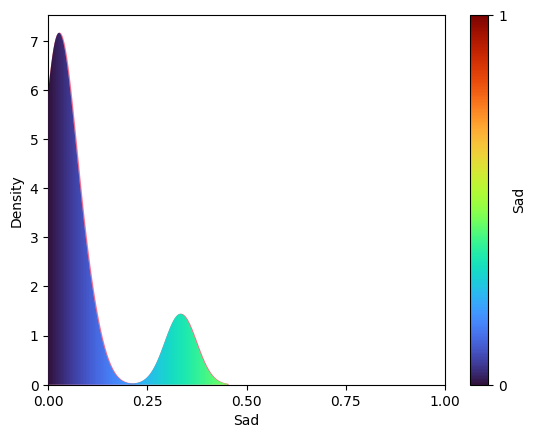

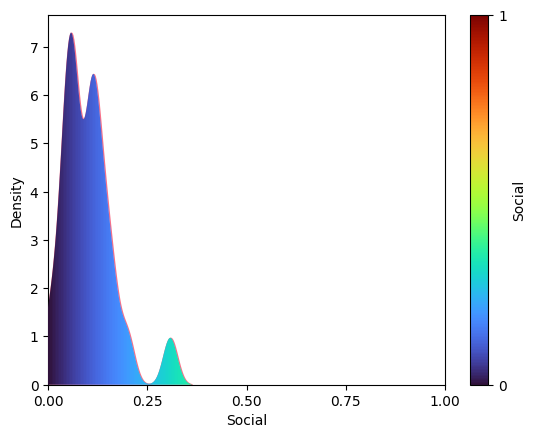

<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)


[68]


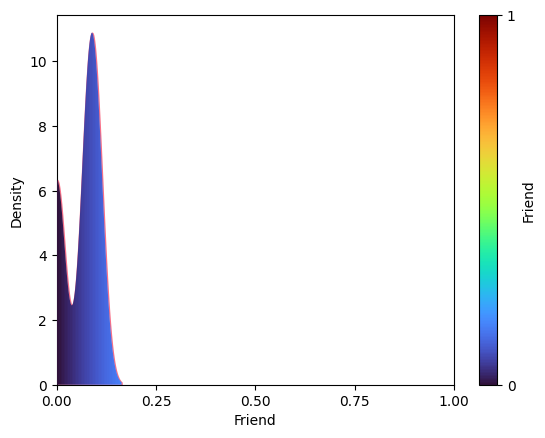

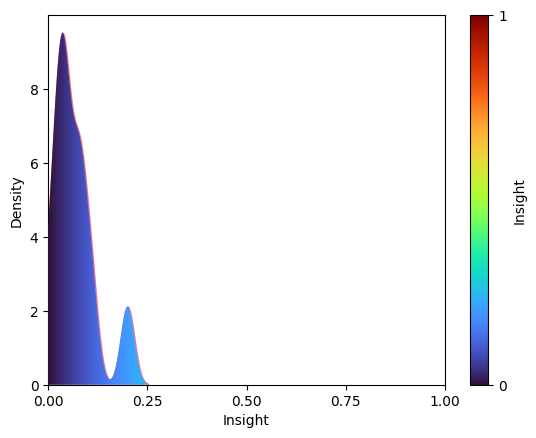

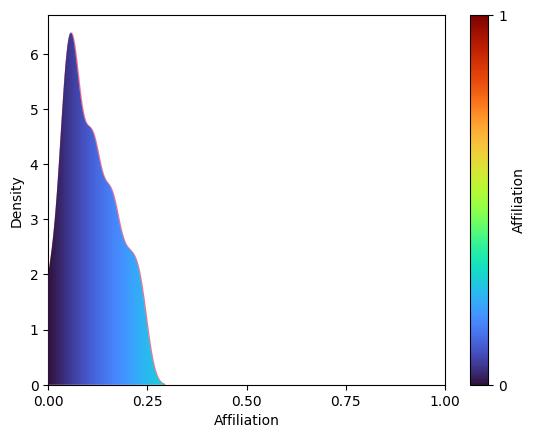

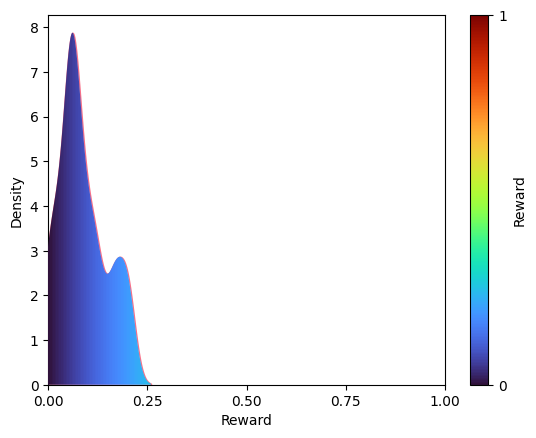

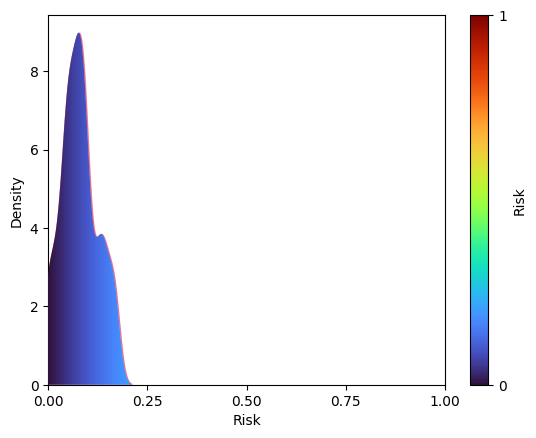

...

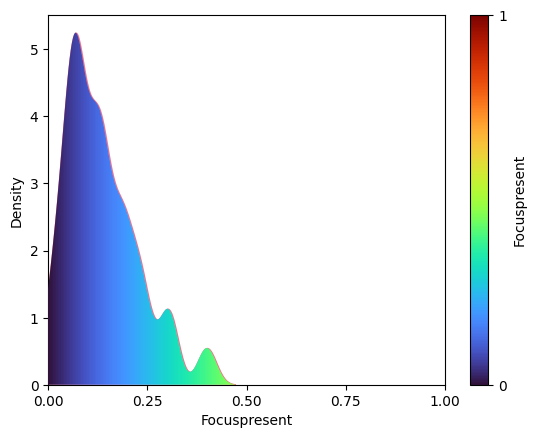

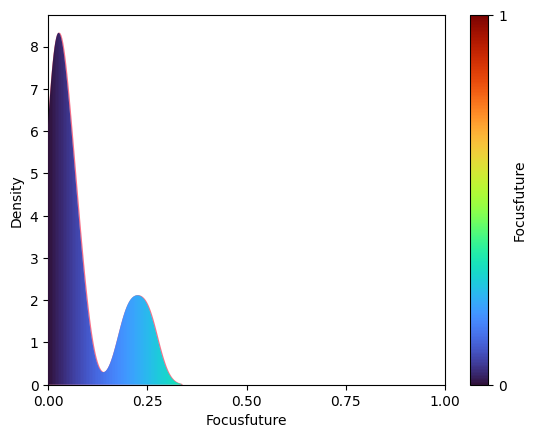

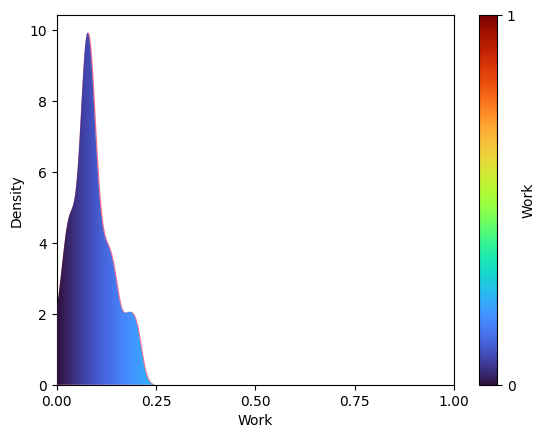

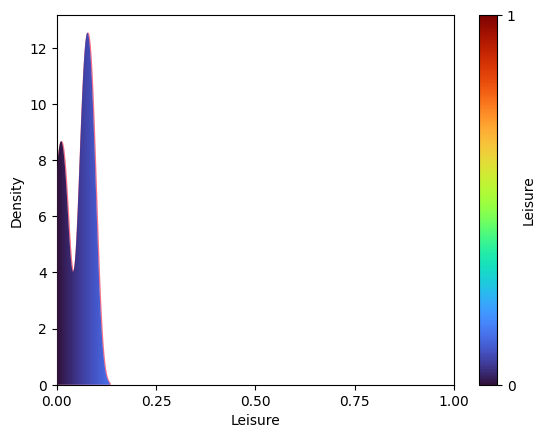

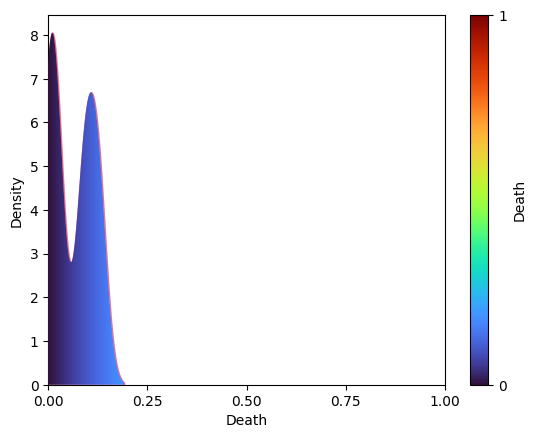

<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)


[68]


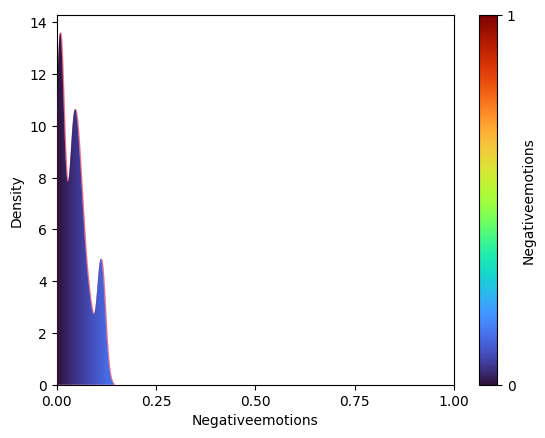

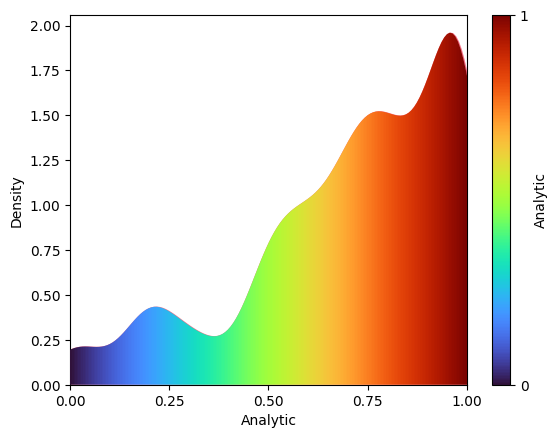

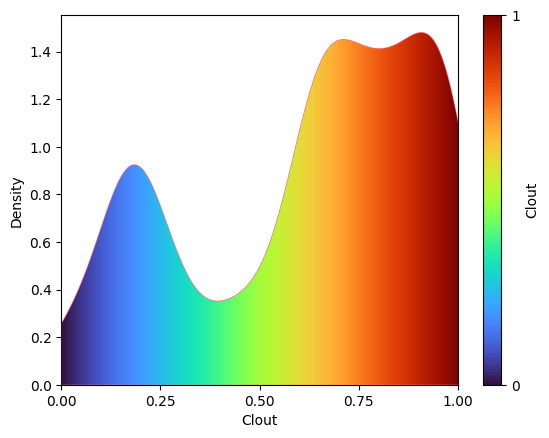

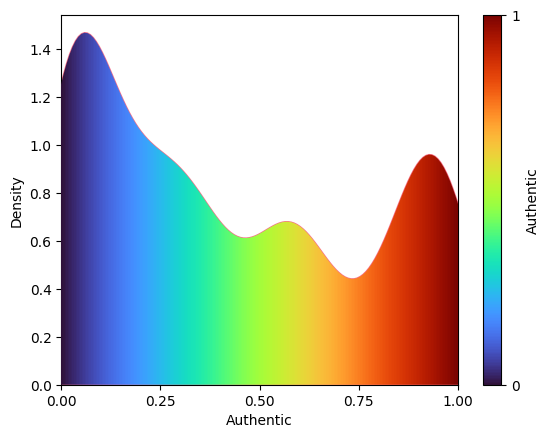

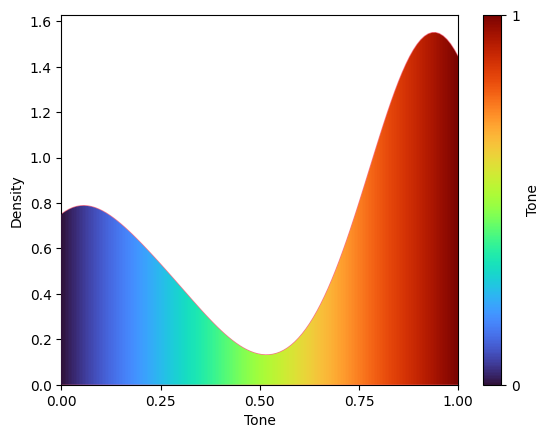

...

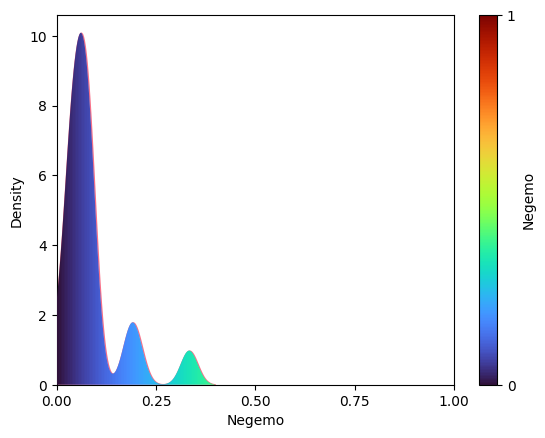

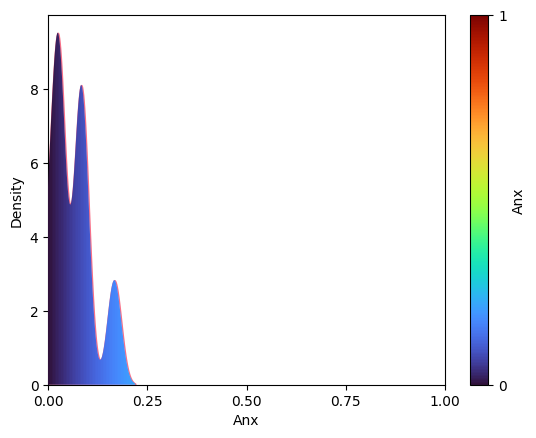

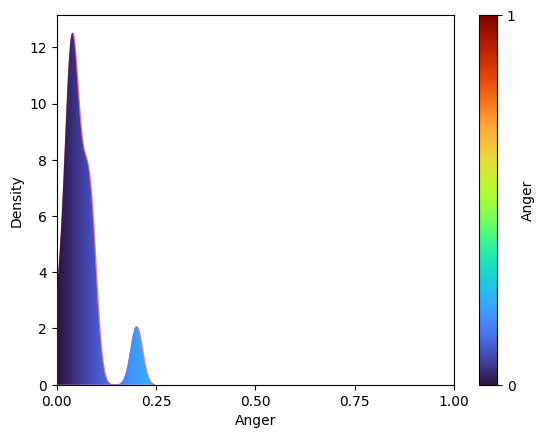

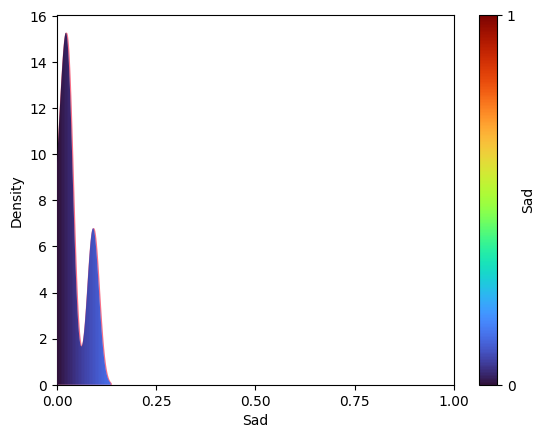

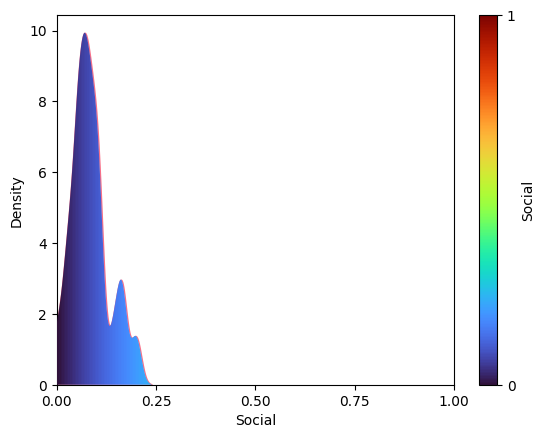

<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)


[57]


<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)


[57]


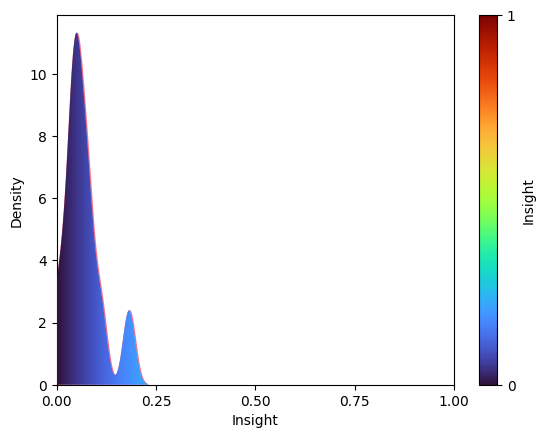

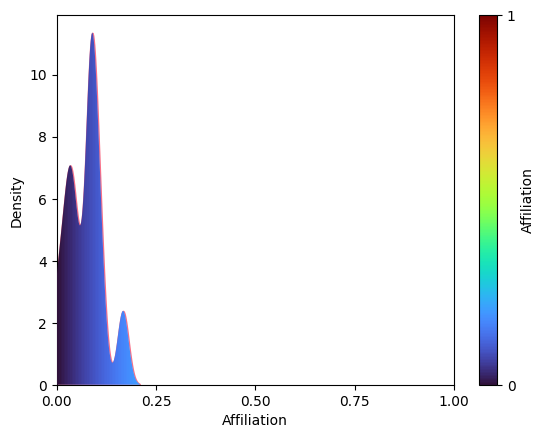

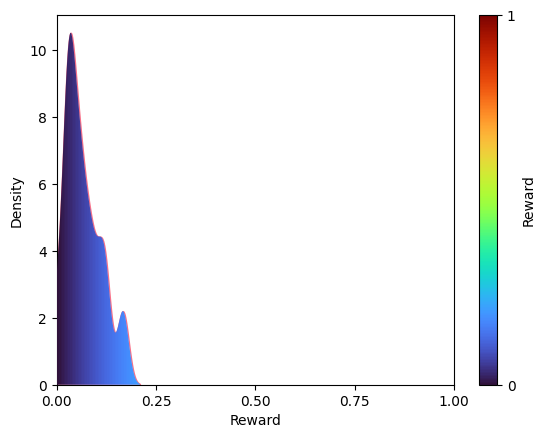

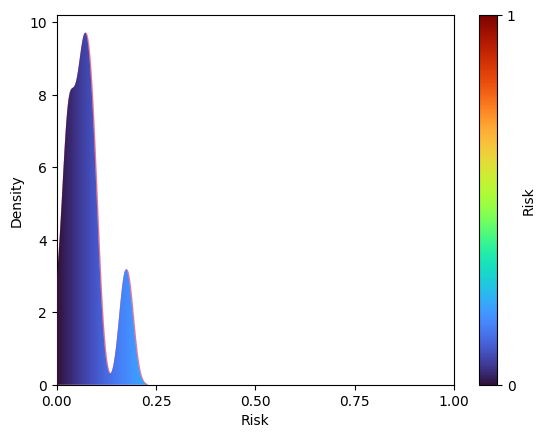

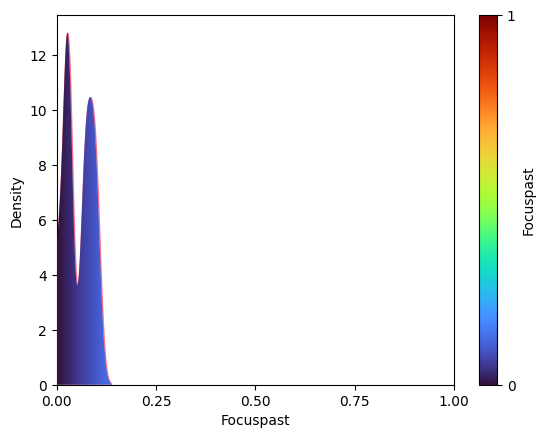

...

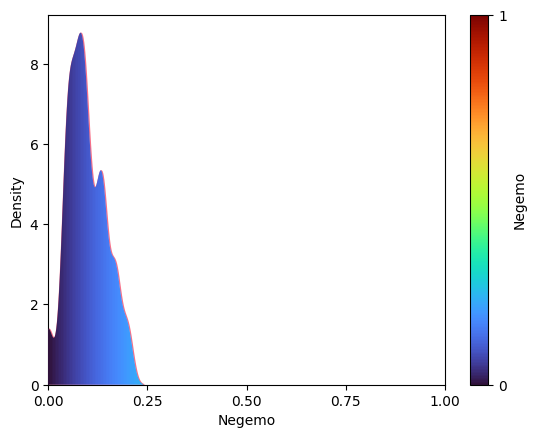

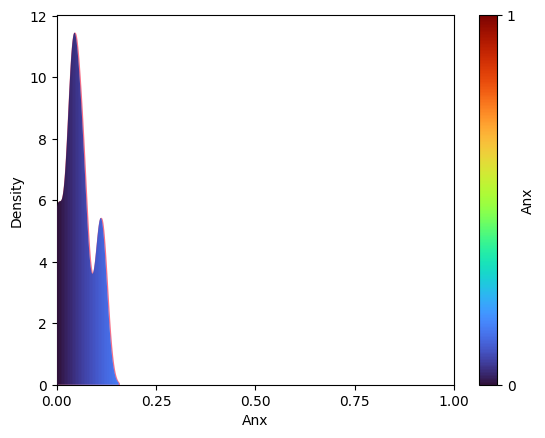

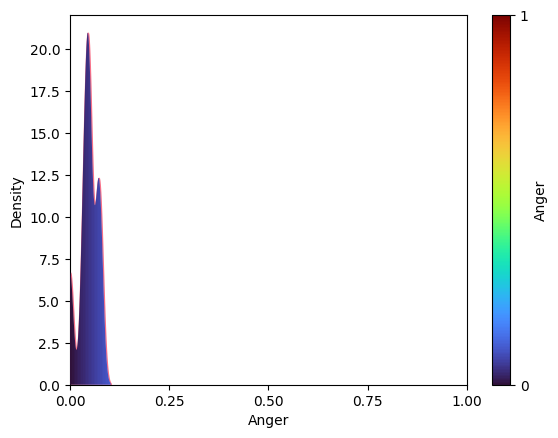

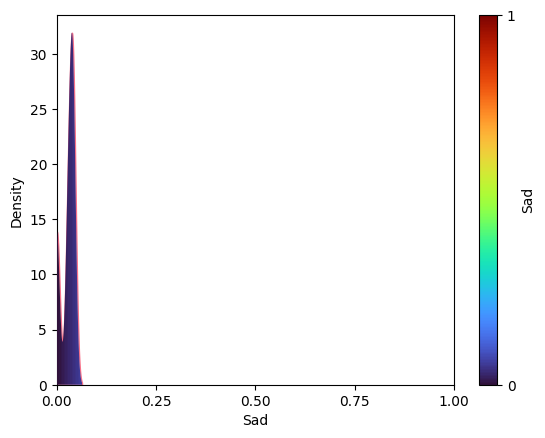

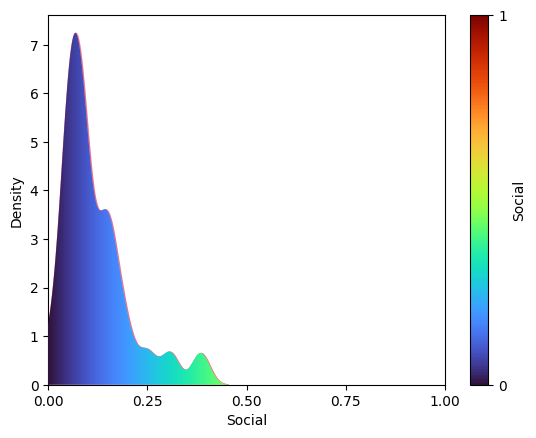

<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)


[57]


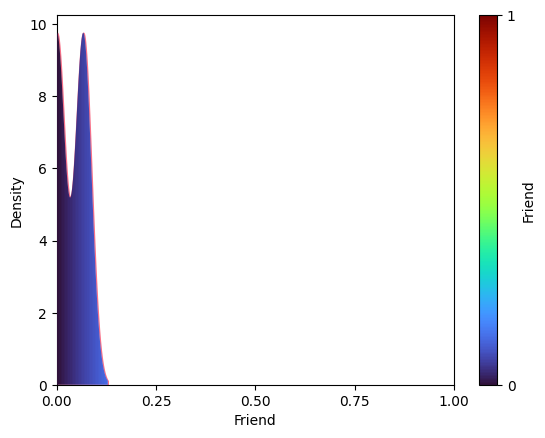

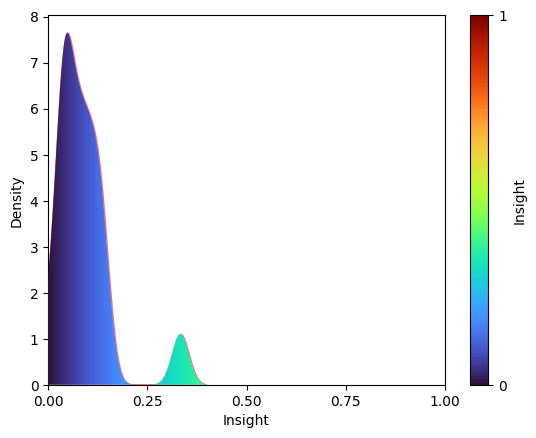

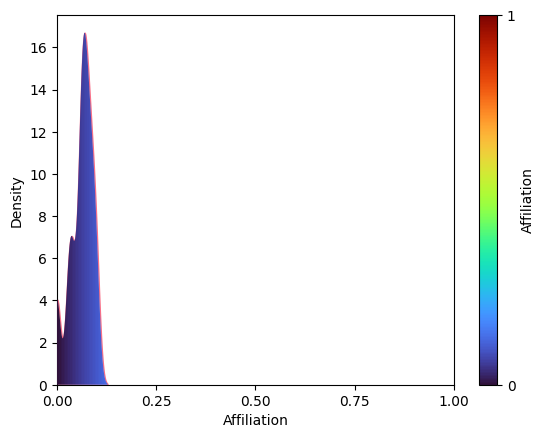

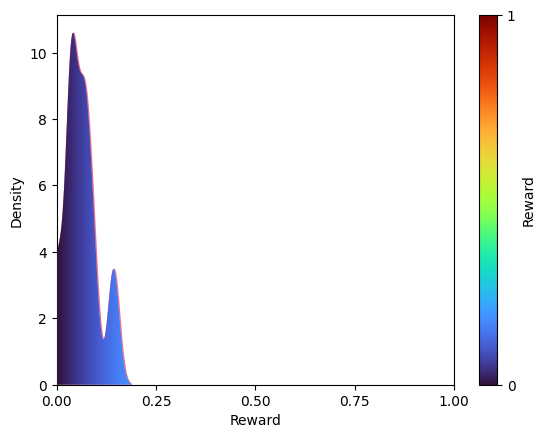

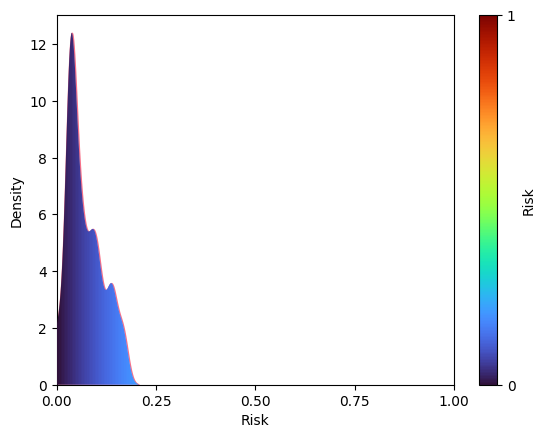

...

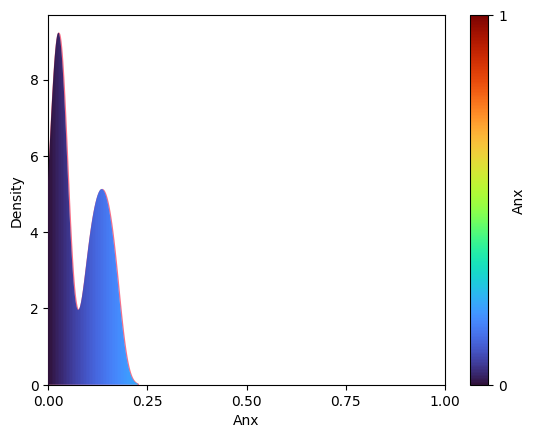

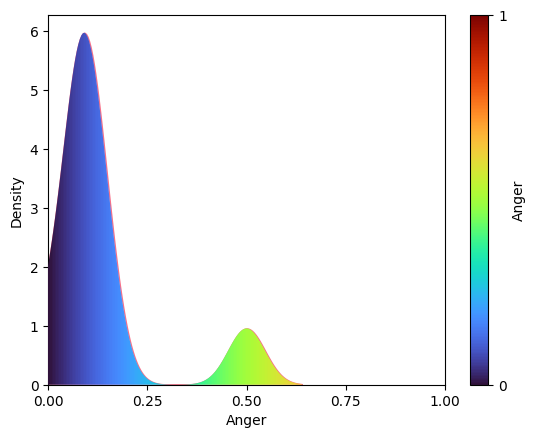

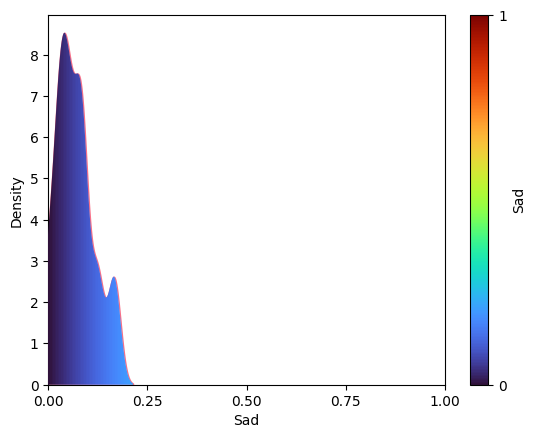

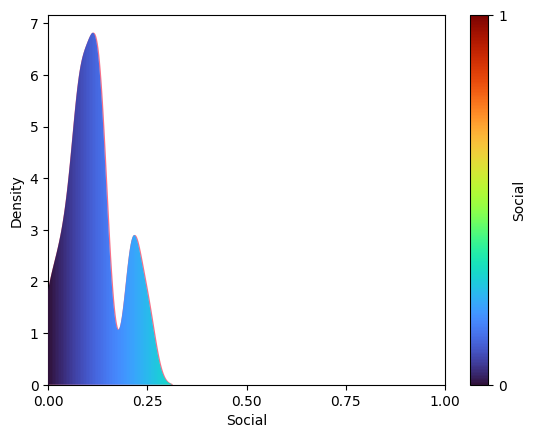

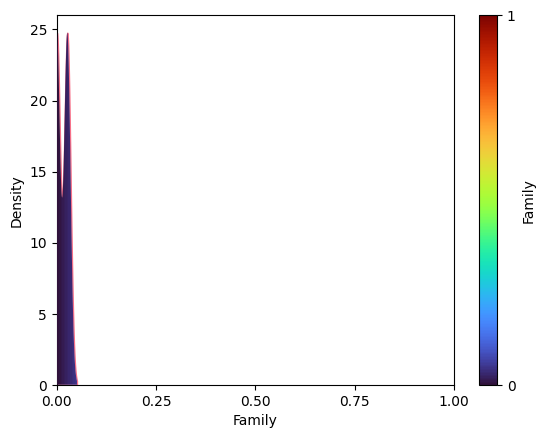

<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)


[44]


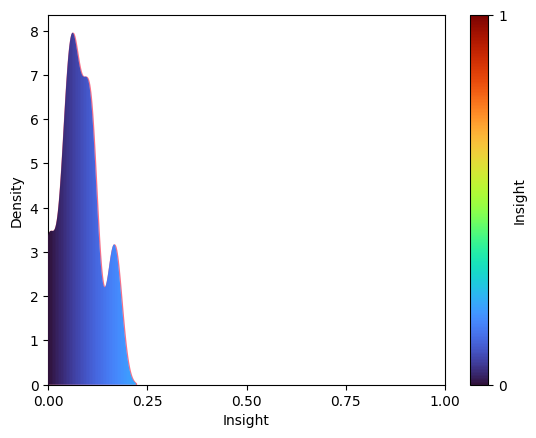

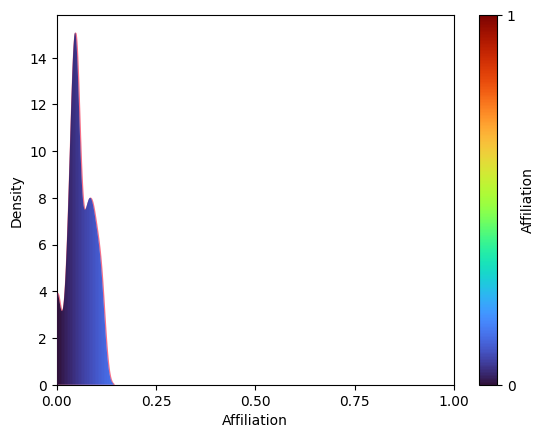

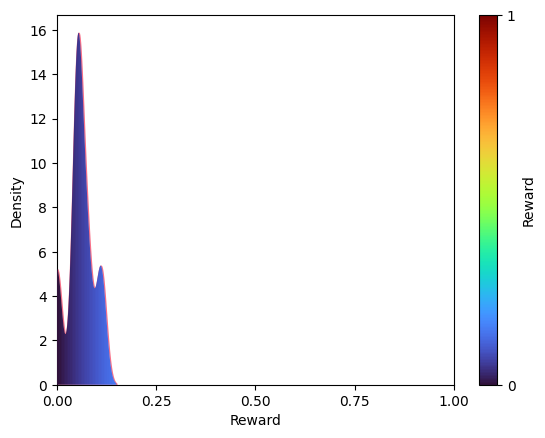

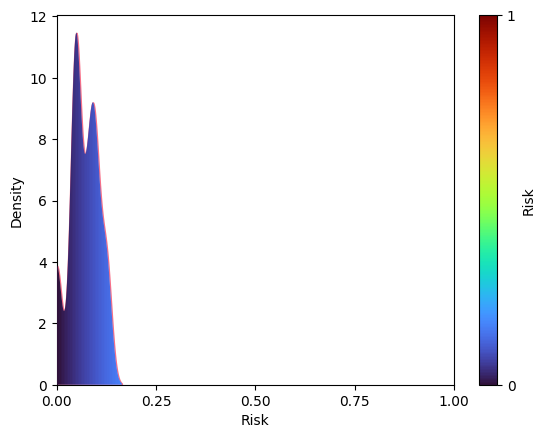

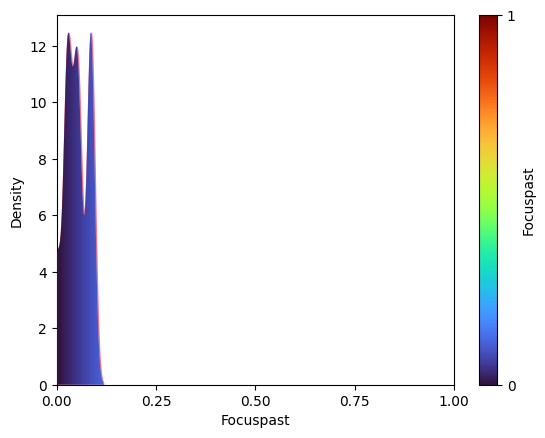

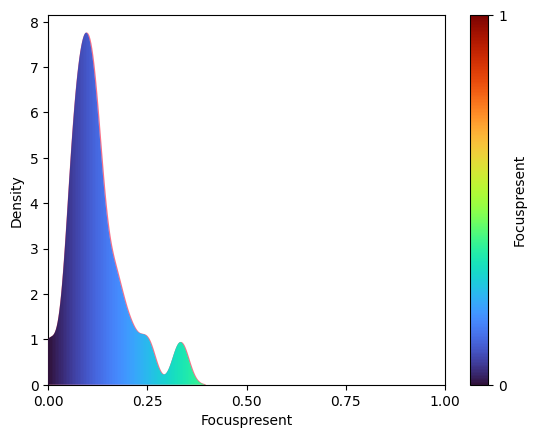

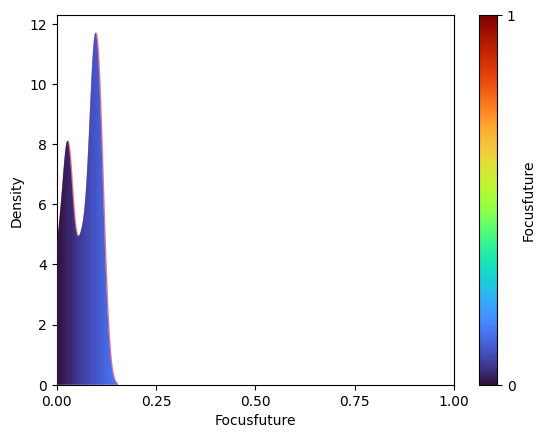

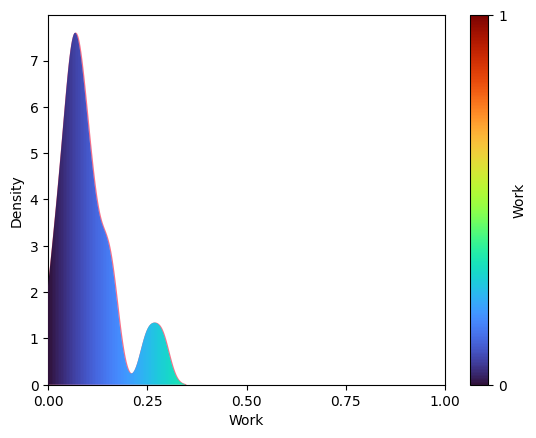

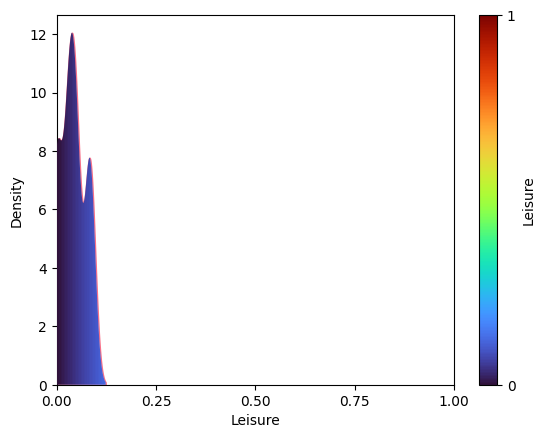

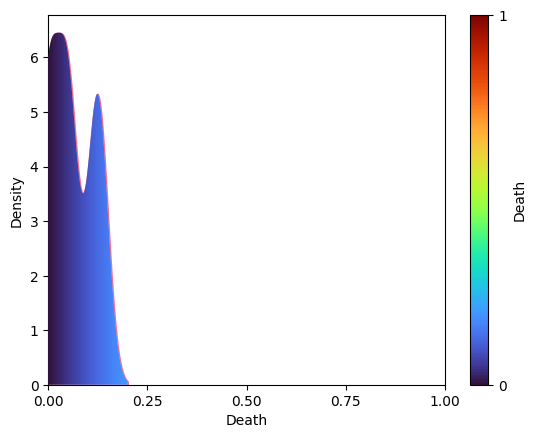

<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)


[44]


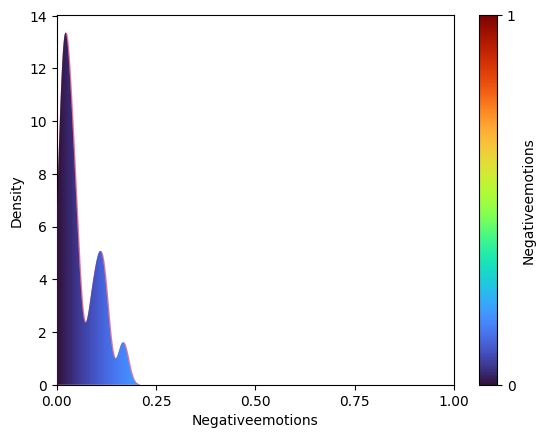

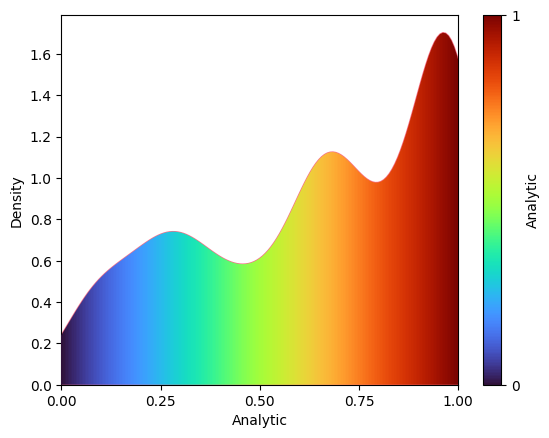

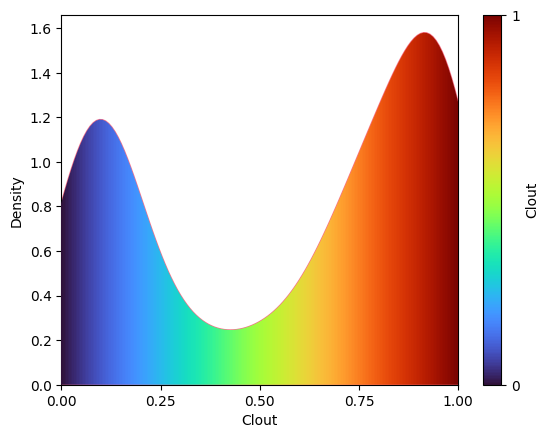

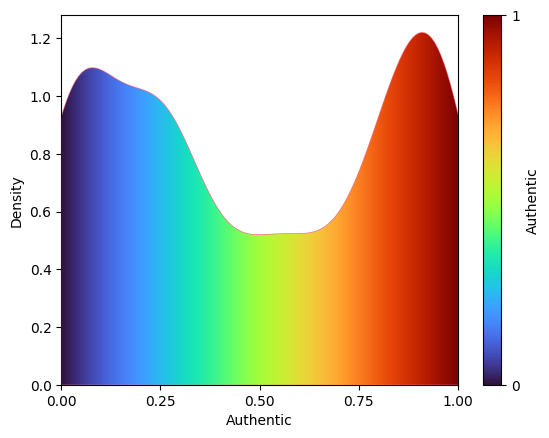

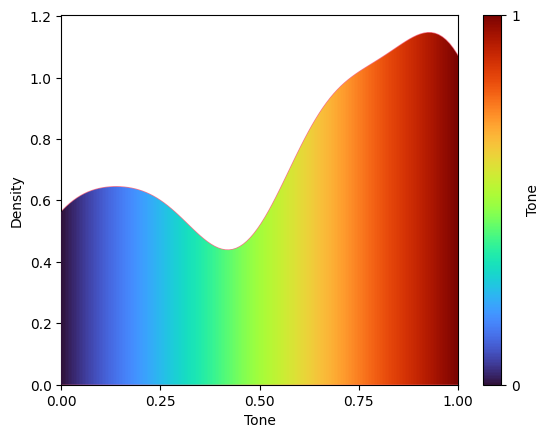

...

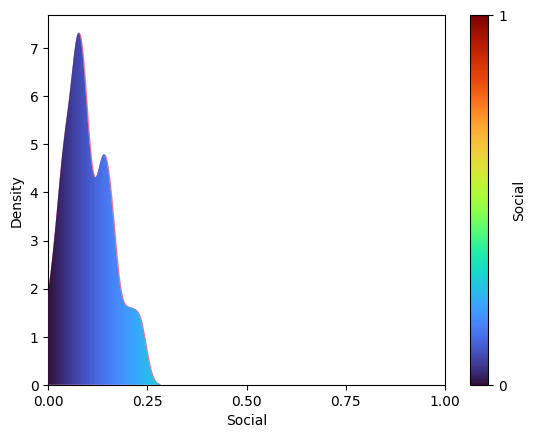

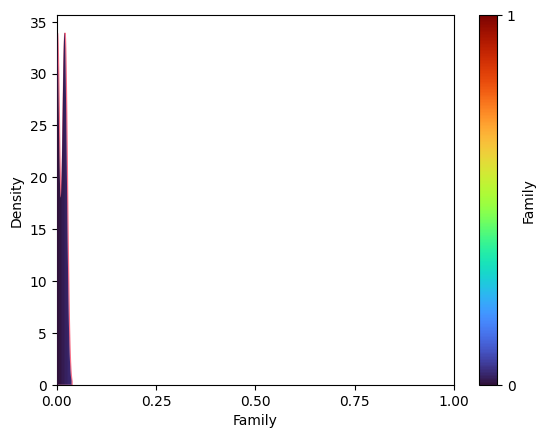

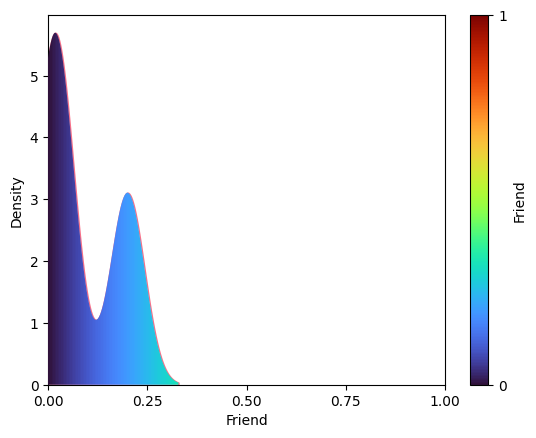

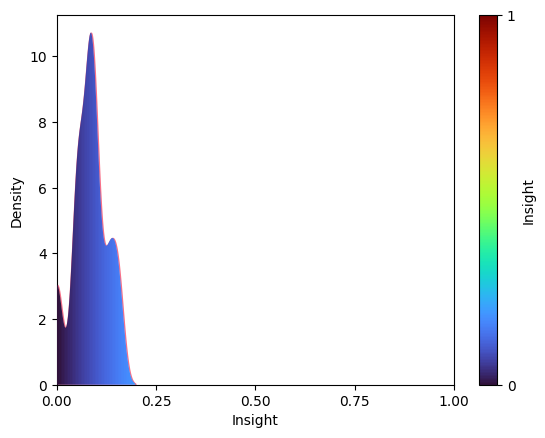

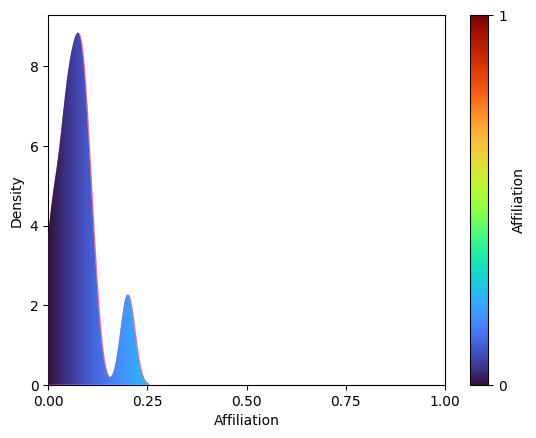

<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)


[41]


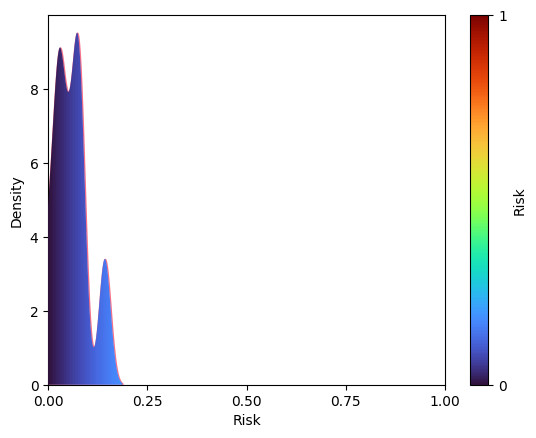

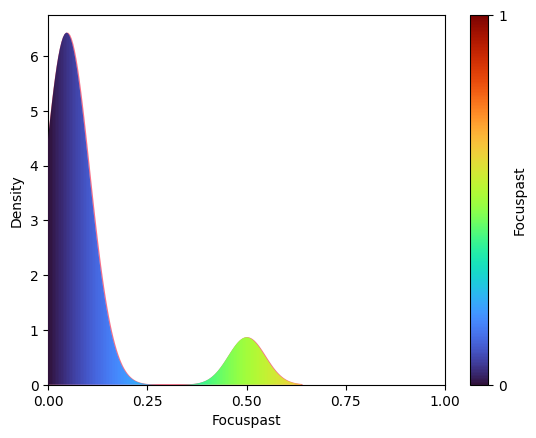

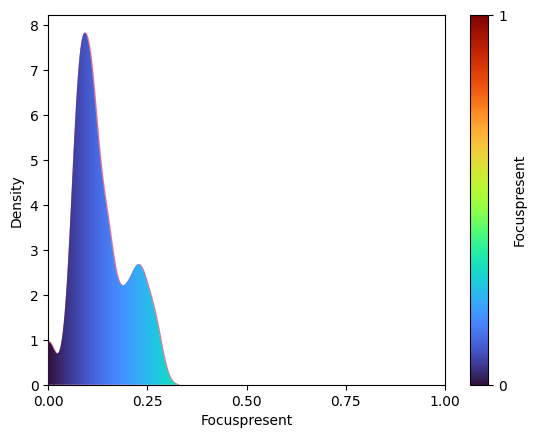

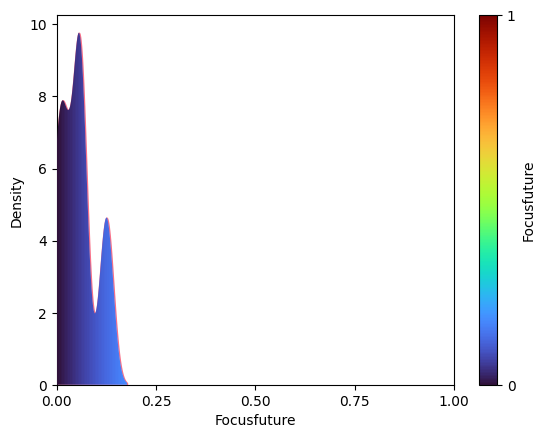

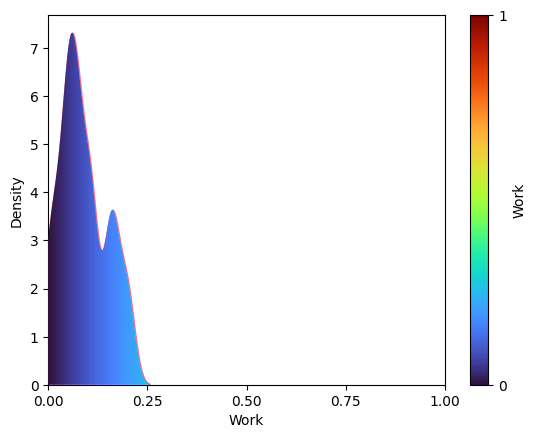

...

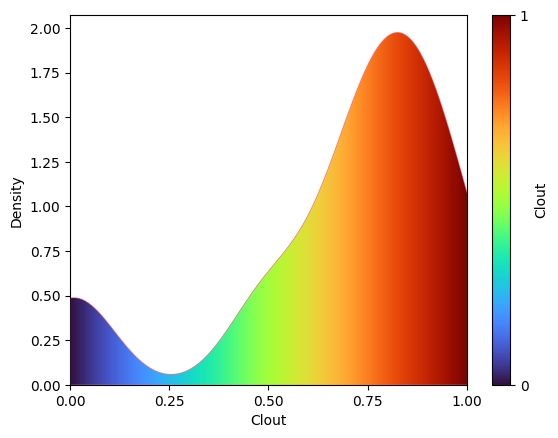

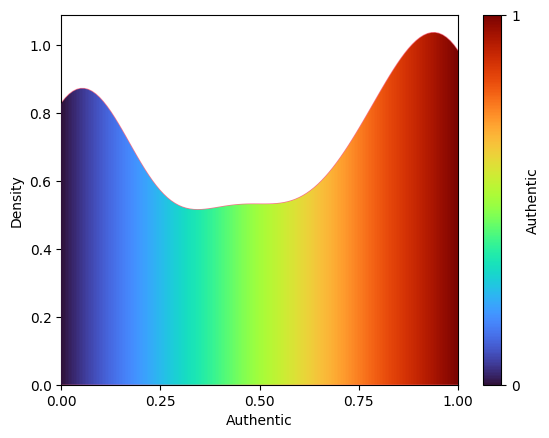

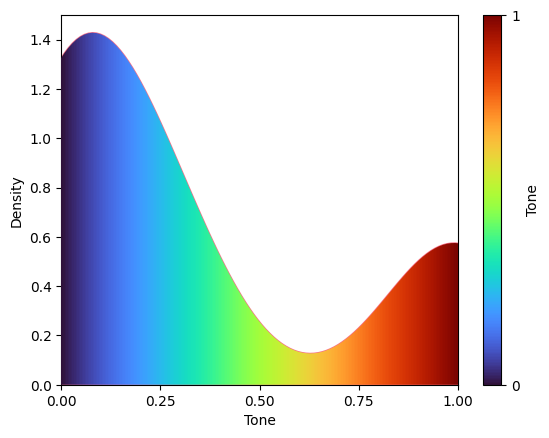

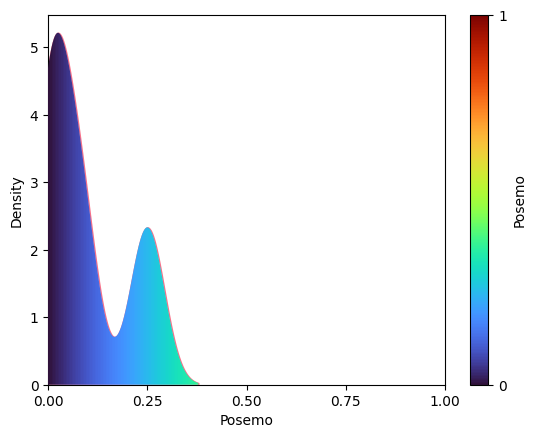

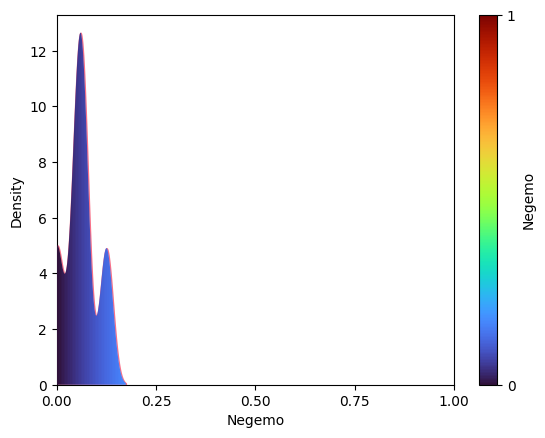

<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)


[12]


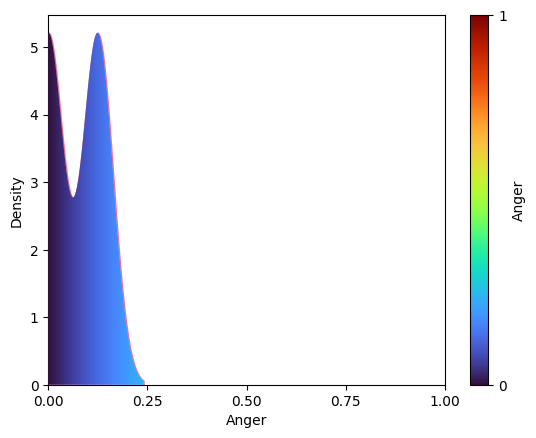

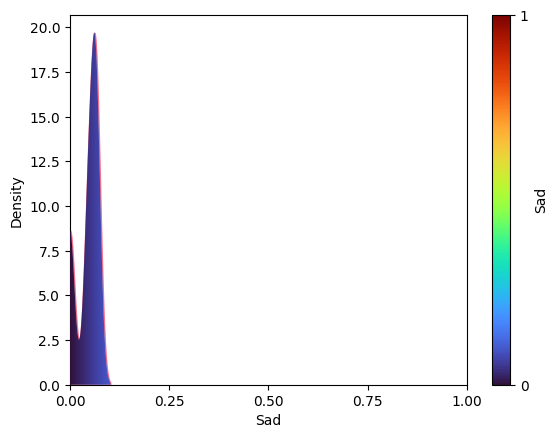

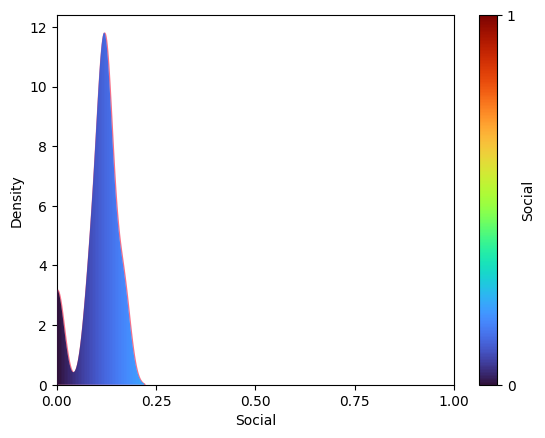

<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)
<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)


[12]
[12]


<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)


[12]


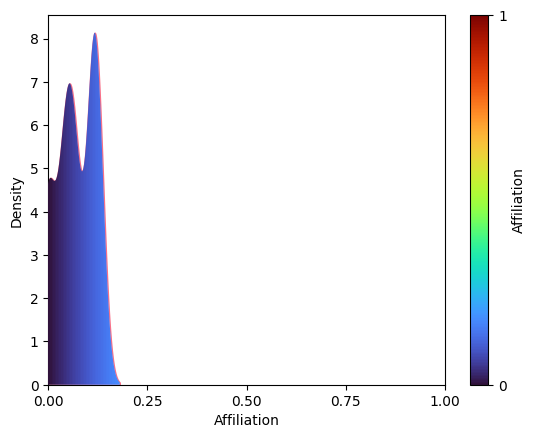

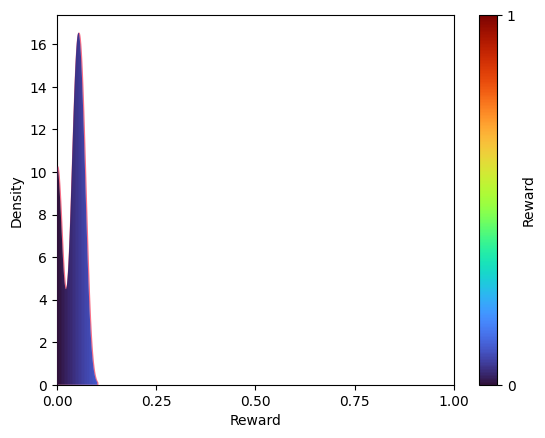

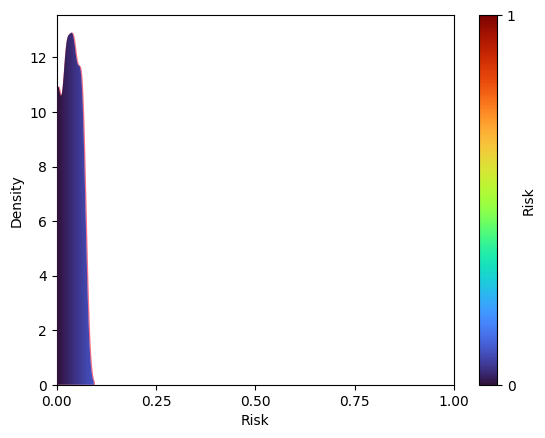

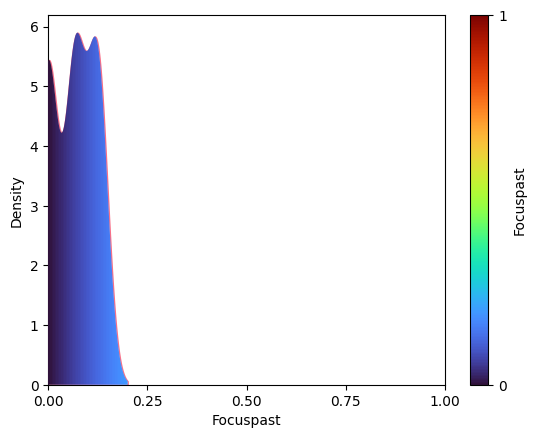

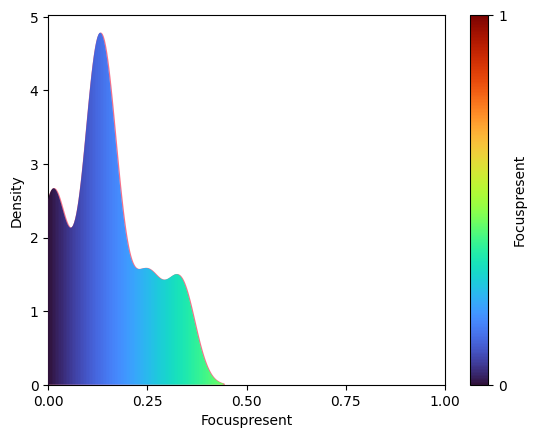

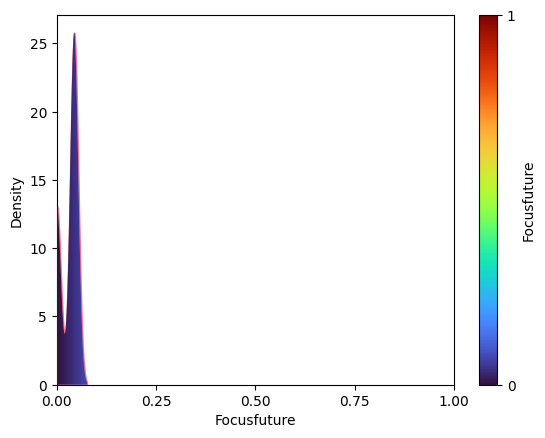

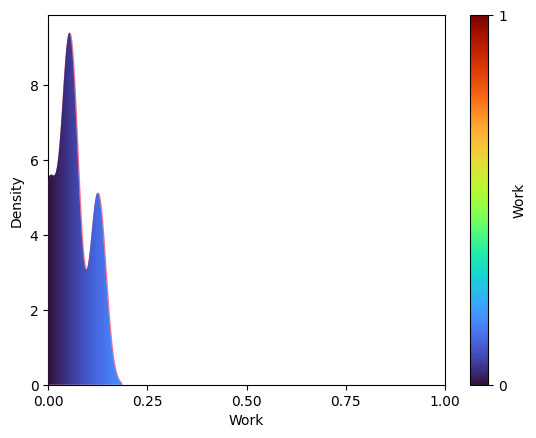

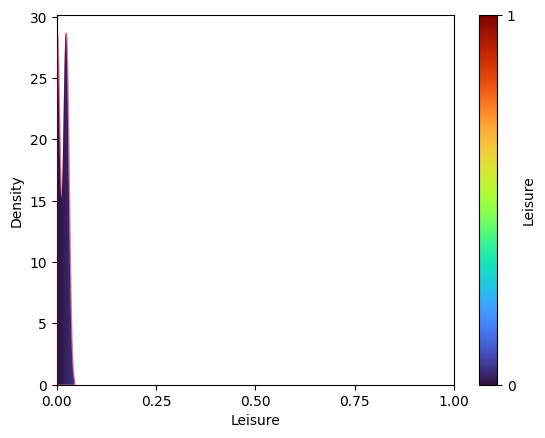

<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)
<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)


[12]
[12]


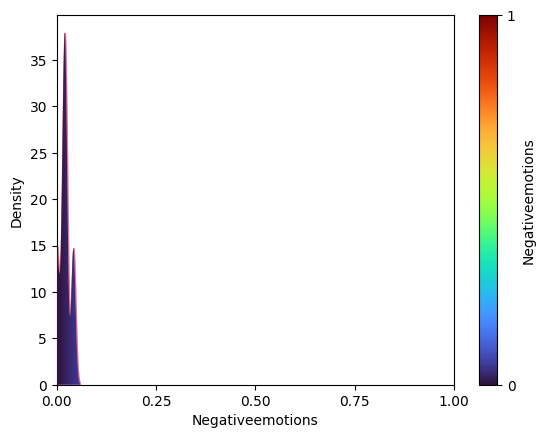

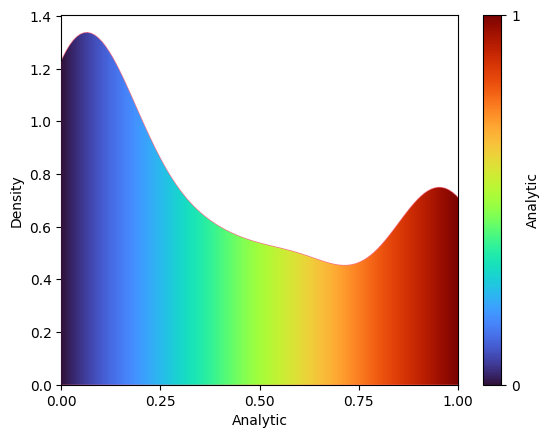

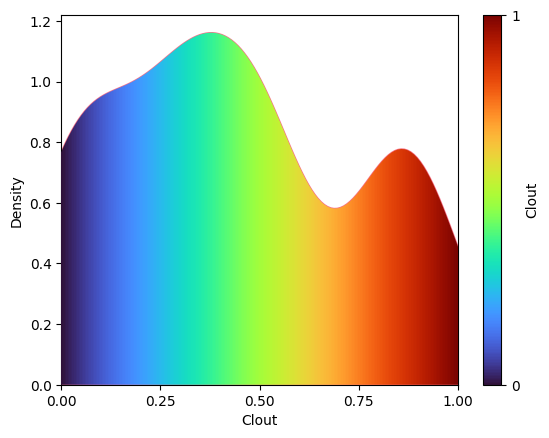

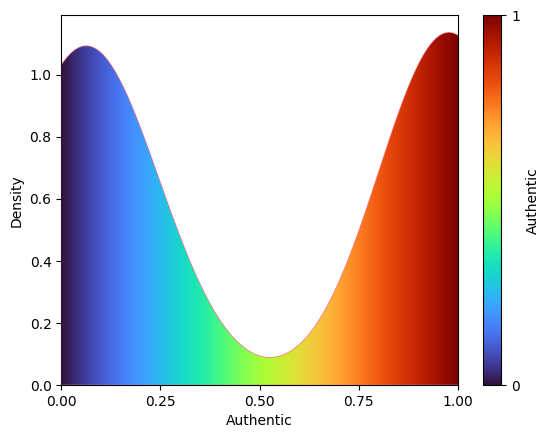

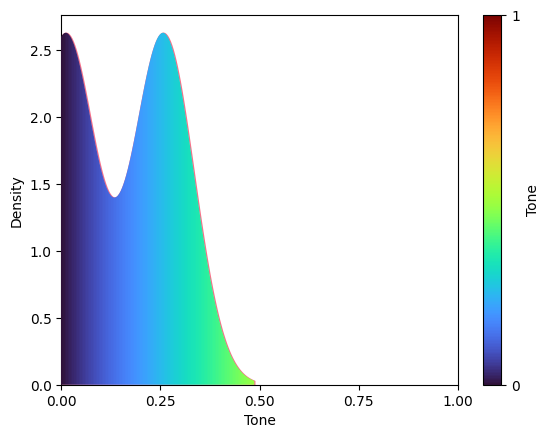

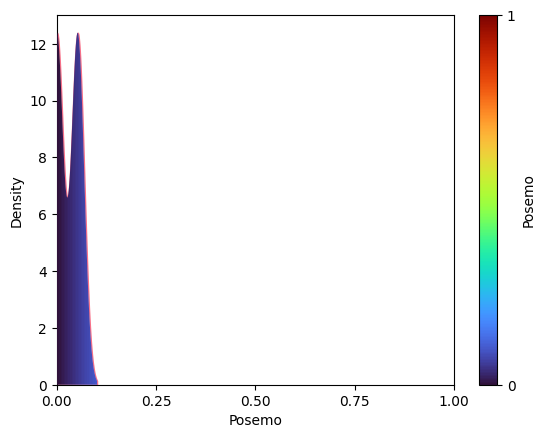

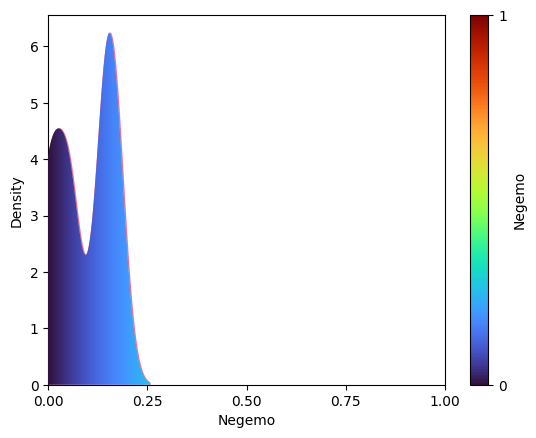

<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)


[8]


<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)


[8]


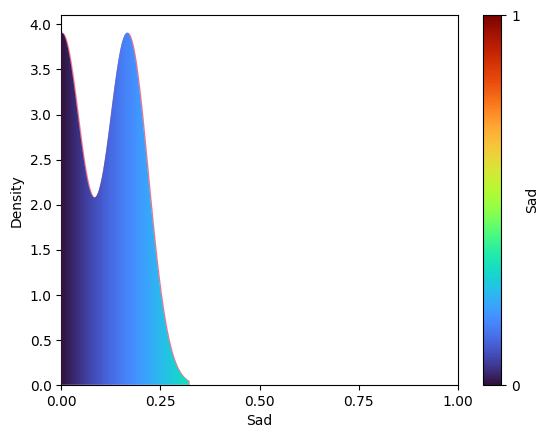

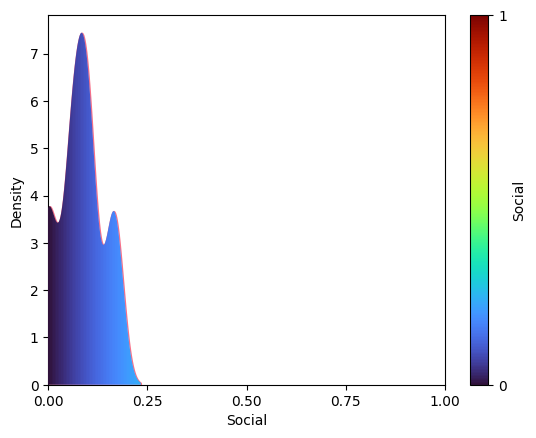

<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)
<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)


[8]
[8]


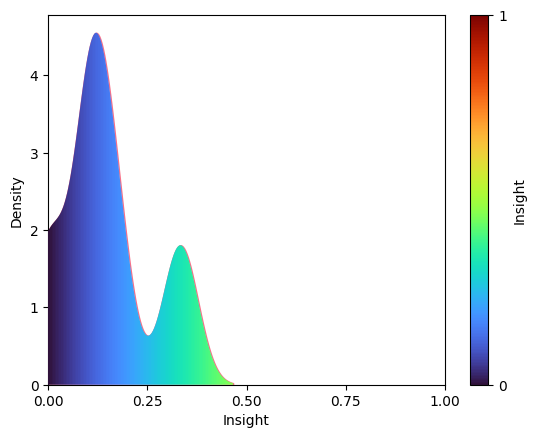

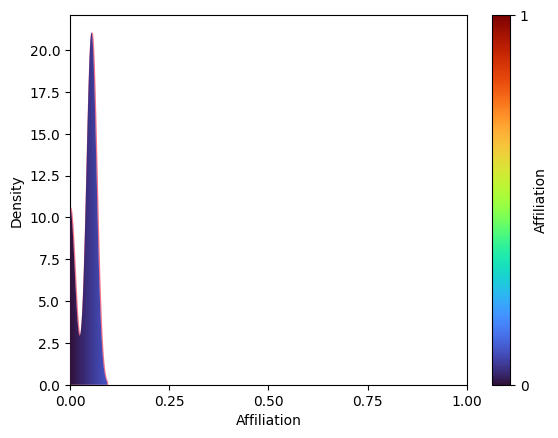

<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)
<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)


[8]
[8]


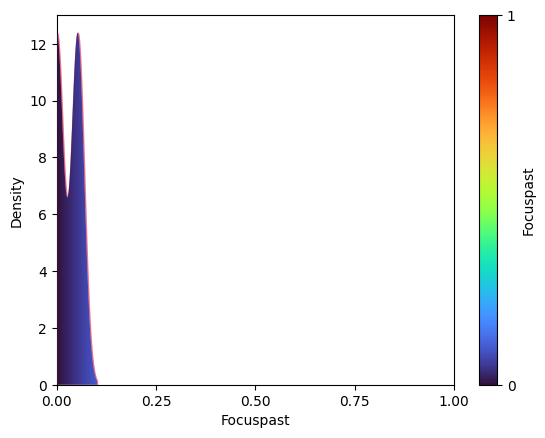

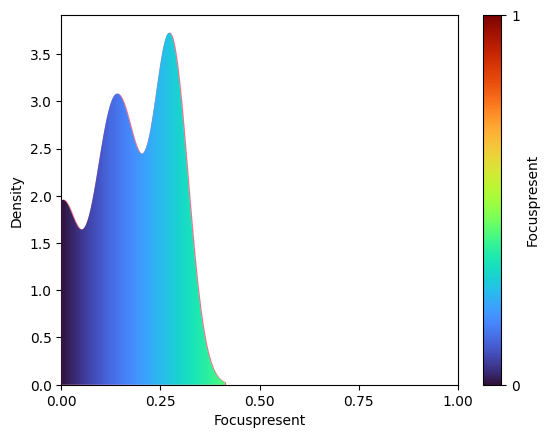

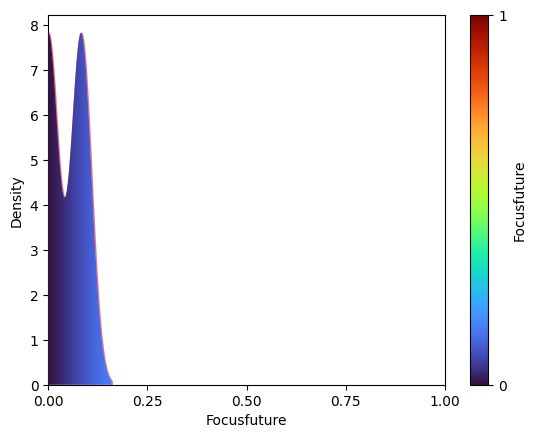

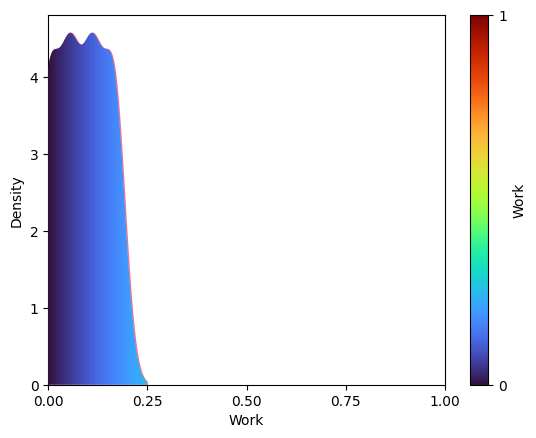

<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)
<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)


[8]
[8]


<ipython-input-55-7c2ae5ef59e1>:25: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)


[8]


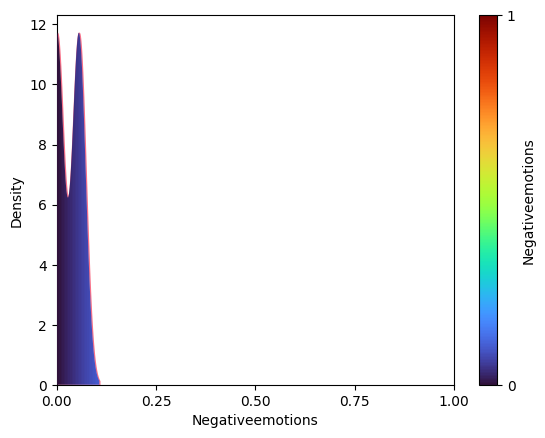

<Figure size 640x480 with 0 Axes>

In [55]:
# Plotting all the chosen markers' "density plots":
#first (1) for each single topic detected by louvain, and secondly (2) for the whole dataset

for i in range(comm_assignment.shape[1]):
  gf=df.iloc[topicsindeces[i],:].copy()
  for j in range(len(ind_plots)):

    # For (2) uncomment the following line
    #gf=df.iloc[:,:].copy()
    marker=gf[selCOL[ind_plots[j]]].copy()

    if ind_plots[j]!=98: # Unless the marker in question is the 'negativeemotions'
    #one defined above (which is already ranging from 0 to 1), we normalize it by dividing for 100:
      marker/=100

    #For (2) comment the next line
    markersdf.iloc[i,len(ind_comparisons)+j]=marker.mean()

    da = np.squeeze(np.asarray(marker))
    k = np.unique(da)
    pk = np.histogram(da,np.append(k,k[-1]+1))[0]

    marker=pd.DataFrame({str(selCOL[ind_plots[j]]):k,'y':pk})

    ax = sns.kdeplot(data=marker, x=selCOL[ind_plots[j]], fill=True,bw_adjust=0.5)

    cmap = 'turbo'
    im = ax.imshow(np.linspace(0, 1, 256).reshape(1, -1), cmap=cmap, aspect='auto',
                  extent=[0,1, *ax.get_ylim()], zorder=10)
    try:
      path = ax.collections[0].get_paths()[0]
    except:
      print(pk)
    else:
      ax.set_xticks([0,0.25,0.5,0.75,1])
      ax.set_xlabel(selCOL[ind_plots[j]].capitalize())
      patch = matplotlib.patches.PathPatch(path, transform=ax.transData)
      im.set_clip_path(patch)
      cbar = plt.colorbar(im, label=selCOL[ind_plots[j]].capitalize())

      cbar.set_ticks([0,1])

      # For (2) replace "'Topics plots/'+f'plot_Topic_{i}_" with "'Entire dataset plots/'+f'plot_"
      plt.savefig(in_dir+'Topics plots/'+f'plot_Topic_{i}_{selCOL[ind_plots[j]]}.png')
      plt.show()

    plt.clf()

  # For (2) uncomment the next line
  #break

<ipython-input-53-84ca2f6fad99>:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('viridis')


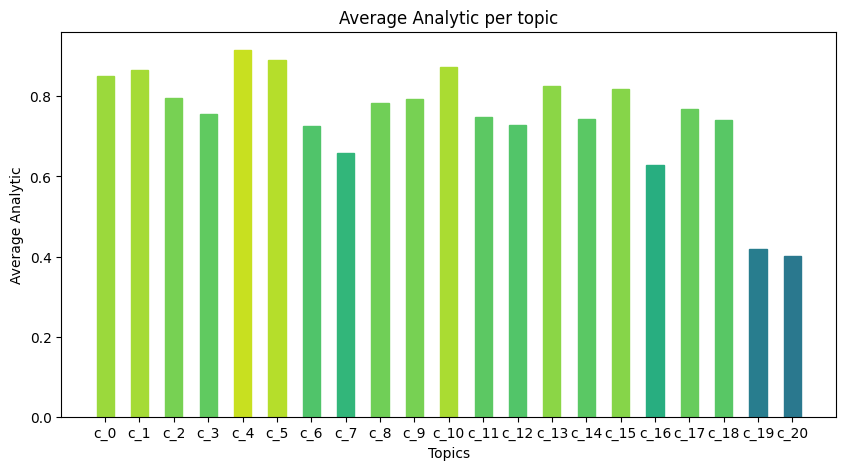

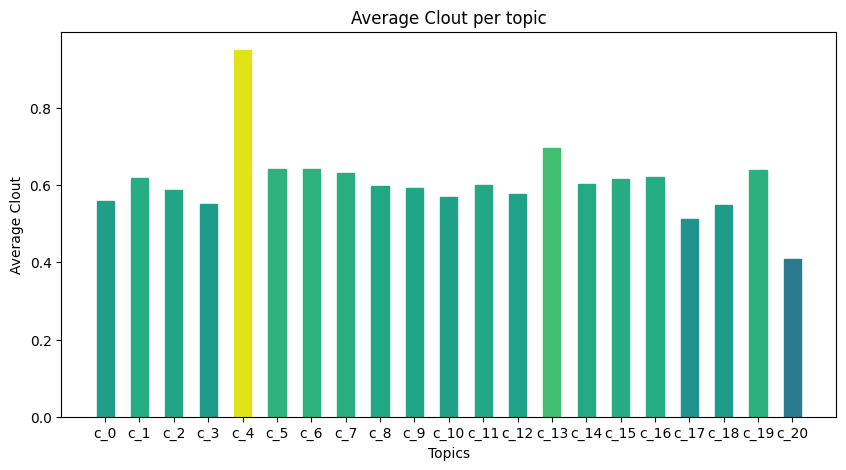

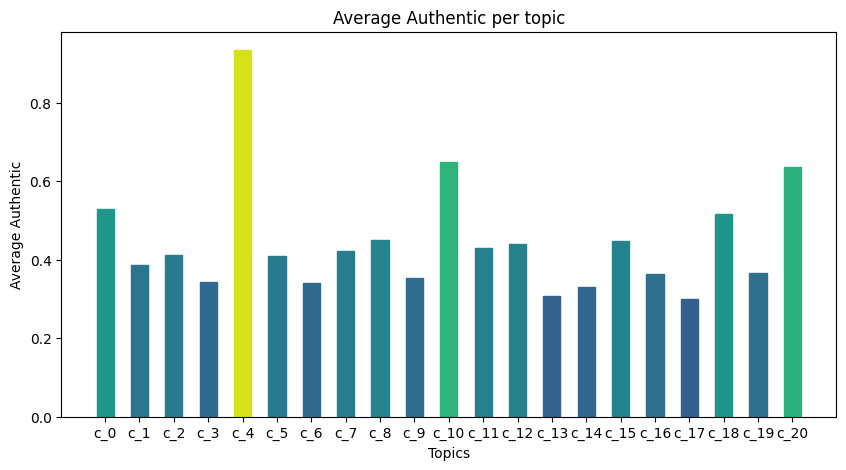

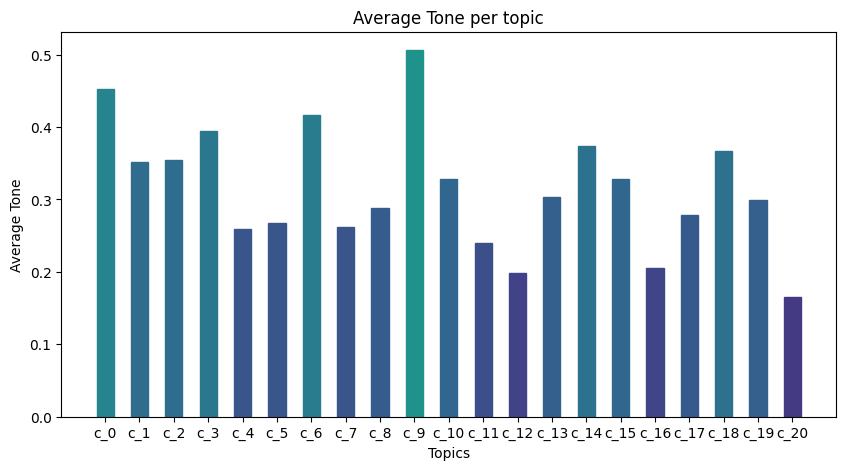

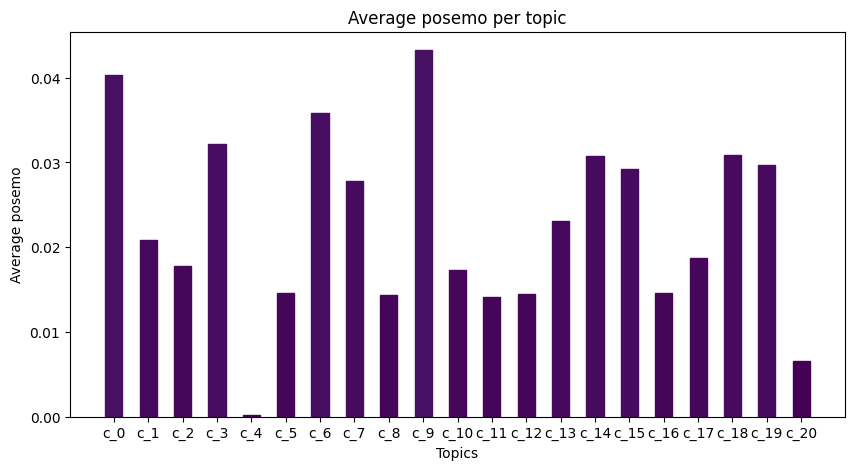

...

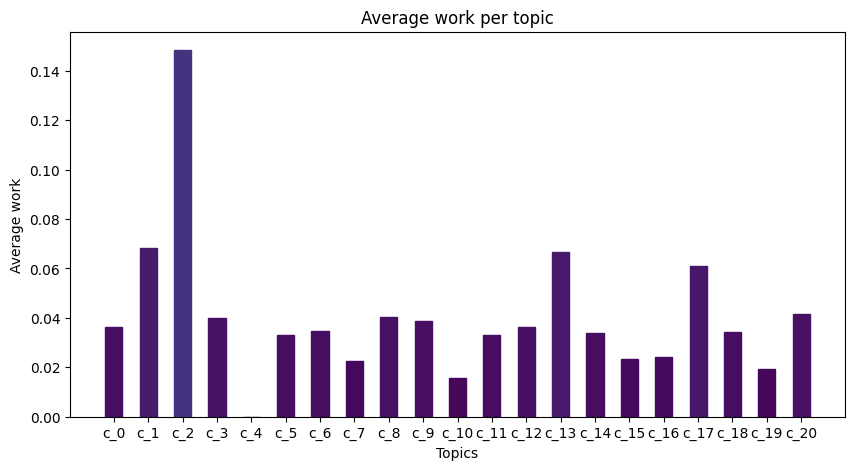

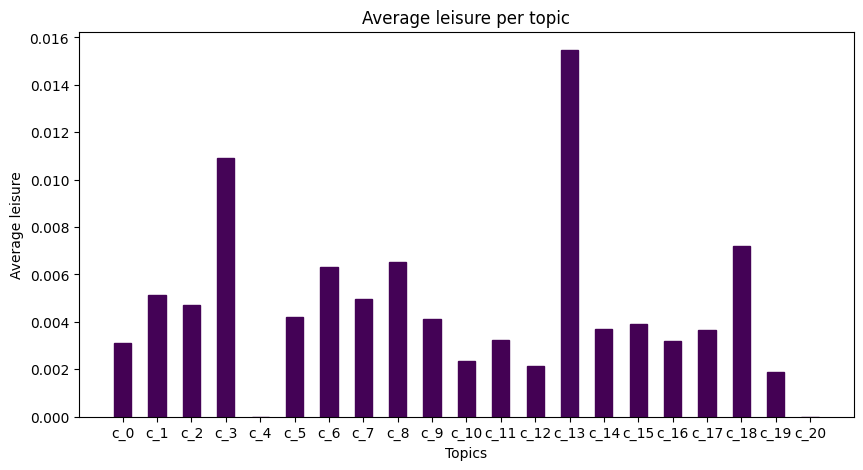

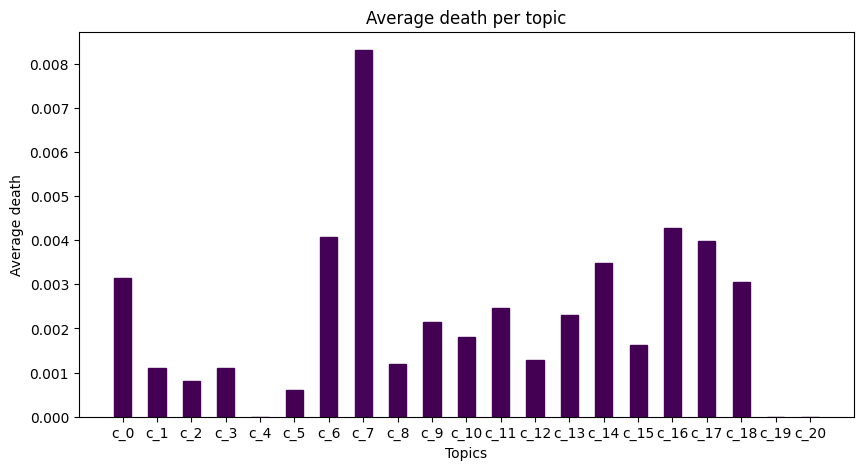

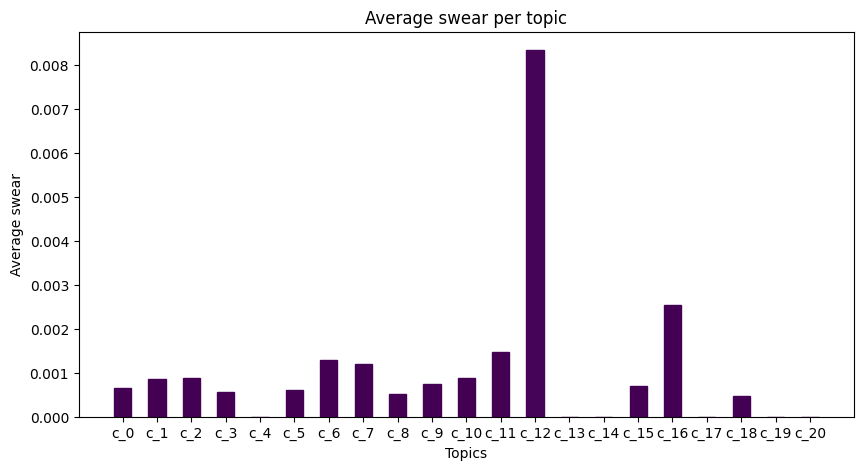

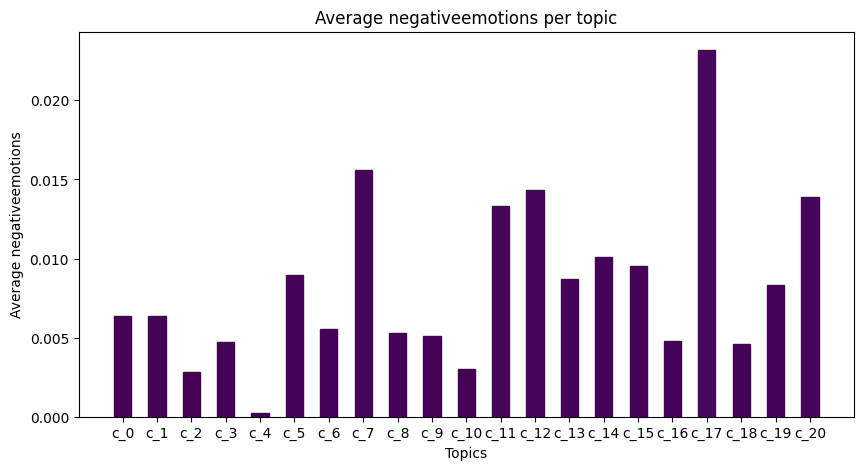

In [ ]:
# Plotting the averages of density markers across all 21 communities

cmap = plt.cm.get_cmap('viridis')
names=['c_{}'.format(i) for i in range(comm_assignment.shape[1])]
for i in range(len(lab_plots)):
  plt.figure(figsize=(10,5))
  sns.set_palette("husl")
  bars=plt.bar(names,markersdf.iloc[:,i+len(lab_comparisons)], width=0.5)
  for j in range(len(names)):
    bars[j].set_color(cmap((markersdf.iloc[j,i+len(lab_comparisons)] )))
    # If we want to color the bars in a clearer but less accurate way:
    # / (markersdf.iloc[:,i+len(lab_comparisons)]).max())

  n = len(markersdf)
  plt.xlabel('Topics')
  plt.ylabel('Average {}'.format(selCOL[ind_plots[i]]))
  plt.title('Average {} per topic'.format(selCOL[ind_plots[i]]))
  plt.savefig(in_dir+'Average plots/'+f'plot_average_{selCOL[ind_plots[i]]}.png')
  plt.show()